# Paqueterias a usar

In [2]:
# MANEJO Y ESTRUCTURA DE DATOS

import numpy as np
import pandas as pd
import os
import gc
import warnings
import statsmodels.api as sm
import itertools
import random
import nbformat
import pickle




# VISUALIZATION DE DATOS

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# MODELOS PARA SIMULACIÓN DE PRECIOS, TRANSACCIONES Y VENTAS | PRUEBAS DE HIPÓTESIS

from statsmodels.tsa.arima_process import ArmaProcess
from arch import arch_model
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
import holidays
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.seasonal import seasonal_decompose


# CONFIGURACIONES

pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')


# Datasets

In [3]:
# DATASET A IMPORTAR
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")
stores = pd.read_csv("stores.csv")
#sub = pd.read_csv("sample_submission.csv")   
transactions = pd.read_csv("transactions.csv").sort_values(["store_nbr", "date"])
oil = pd.read_csv("oil.csv")
holidays = pd.read_csv("holidays_events.csv")


# FECHAS Y HORAS
train["date"] = pd.to_datetime(train.date)
test["date"] = pd.to_datetime(test.date)
transactions["date"] = pd.to_datetime(transactions.date)
holidays["date"] = pd.to_datetime(holidays.date)
oil["date"] = pd.to_datetime(oil.date)


# AJUSTE TIPOS DE DATOS OBJETO A NÚMERICO
train.onpromotion = train.onpromotion.astype("float16")
train.sales = train.sales.astype("float32")
stores.cluster = stores.cluster.astype("int8")



# EDA: Observación General

In [3]:
# DETALLE DE INFORMACIÓN EN DATASETS: COLUMNAS, INDEX, TIPOS DE DATOS, VALORES NULOS, RESUMEN ESTADISTICO  

stores.info()
transactions.info()
oil.info()
holidays.info()
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int8  
dtypes: int64(1), int8(1), object(3)
memory usage: 1.9+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 83488 entries, 1 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   transactions  83488 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 2.5 MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype       

In [4]:
stores.describe()

,store_nbr,cluster
count,54.00,54.00
mean,27.50,8.48
std,15.73,4.69
min,1.00,1.00
25%,14.25,4.00
50%,27.50,8.50
75%,40.75,13.00
max,54.00,17.00


In [5]:
transactions.describe()

,store_nbr,transactions
count,83488.00,83488.00
mean,26.94,1694.60
std,15.61,963.29
min,1.00,5.00
25%,13.00,1046.00
50%,27.00,1393.00
75%,40.00,2079.00
max,54.00,8359.00


In [6]:
oil.describe()

,dcoilwtico
count,1175.00
mean,67.71
std,25.63
min,26.19
25%,46.41
50%,53.19
75%,95.66
max,110.62


In [7]:
transactions.isnull().sum()

date            0
store_nbr       0
transactions    0
dtype: int64

In [8]:
stores.isnull().sum()

store_nbr    0
city         0
state        0
type         0
cluster      0
dtype: int64

In [9]:
oil.isnull().sum()

date           0
dcoilwtico    43
dtype: int64

In [10]:
(oil.isnull().sum() / oil.shape[0]).round(2)

date         0.00
dcoilwtico   0.04
dtype: float64

In [11]:
holidays.isnull().sum()

date           0
type           0
locale         0
locale_name    0
description    0
transferred    0
dtype: int64

In [12]:
train.sales == 0

0           True
1           True
2           True
3           True
4           True
           ...  
3000883    False
3000884    False
3000885    False
3000886    False
3000887    False
Name: sales, Length: 3000888, dtype: bool

In [13]:
stores['city'].unique()

array(['Quito', 'Santo Domingo', 'Cayambe', 'Latacunga', 'Riobamba',
       'Ibarra', 'Guaranda', 'Puyo', 'Ambato', 'Guayaquil', 'Salinas',
       'Daule', 'Babahoyo', 'Quevedo', 'Playas', 'Libertad', 'Cuenca',
       'Loja', 'Machala', 'Esmeraldas', 'Manta', 'El Carmen'],
      dtype=object)

In [14]:
stores['state'].unique()

array(['Pichincha', 'Santo Domingo de los Tsachilas', 'Cotopaxi',
       'Chimborazo', 'Imbabura', 'Bolivar', 'Pastaza', 'Tungurahua',
       'Guayas', 'Santa Elena', 'Los Rios', 'Azuay', 'Loja', 'El Oro',
       'Esmeraldas', 'Manabi'], dtype=object)

In [15]:
holidays['type'].unique()

array(['Holiday', 'Transfer', 'Additional', 'Bridge', 'Work Day', 'Event'],
      dtype=object)

In [16]:
holidays['locale'].unique()

array(['Local', 'Regional', 'National'], dtype=object)

In [17]:
holidays['locale_name'].unique()

array(['Manta', 'Cotopaxi', 'Cuenca', 'Libertad', 'Riobamba', 'Puyo',
       'Guaranda', 'Imbabura', 'Latacunga', 'Machala', 'Santo Domingo',
       'El Carmen', 'Cayambe', 'Esmeraldas', 'Ecuador', 'Ambato',
       'Ibarra', 'Quevedo', 'Santo Domingo de los Tsachilas',
       'Santa Elena', 'Quito', 'Loja', 'Salinas', 'Guayaquil'],
      dtype=object)

In [18]:
holidays['description'].unique()

array(['Fundacion de Manta', 'Provincializacion de Cotopaxi',
       'Fundacion de Cuenca', 'Cantonizacion de Libertad',
       'Cantonizacion de Riobamba', 'Cantonizacion del Puyo',
       'Cantonizacion de Guaranda', 'Provincializacion de Imbabura',
       'Cantonizacion de Latacunga', 'Fundacion de Machala',
       'Fundacion de Santo Domingo', 'Cantonizacion de El Carmen',
       'Cantonizacion de Cayambe', 'Fundacion de Esmeraldas',
       'Primer Grito de Independencia', 'Fundacion de Riobamba',
       'Fundacion de Ambato', 'Fundacion de Ibarra',
       'Cantonizacion de Quevedo', 'Independencia de Guayaquil',
       'Traslado Independencia de Guayaquil', 'Dia de Difuntos',
       'Independencia de Cuenca', 'Provincializacion de Santo Domingo',
       'Provincializacion Santa Elena', 'Independencia de Guaranda',
       'Independencia de Latacunga', 'Independencia de Ambato',
       'Fundacion de Quito-1', 'Fundacion de Quito', 'Fundacion de Loja',
       'Navidad-4', 'Cantonizac

In [19]:
stores['city'].value_counts()

Quito            18
Guayaquil         8
Cuenca            3
Santo Domingo     3
Manta             2
Latacunga         2
Machala           2
Ambato            2
Quevedo           1
Esmeraldas        1
Loja              1
Libertad          1
Playas            1
Daule             1
Babahoyo          1
Salinas           1
Puyo              1
Guaranda          1
Ibarra            1
Riobamba          1
Cayambe           1
El Carmen         1
Name: city, dtype: int64

In [20]:
stores['state'].value_counts()

Pichincha                         19
Guayas                            11
Santo Domingo de los Tsachilas     3
Azuay                              3
Manabi                             3
Cotopaxi                           2
Tungurahua                         2
Los Rios                           2
El Oro                             2
Chimborazo                         1
Imbabura                           1
Bolivar                            1
Pastaza                            1
Santa Elena                        1
Loja                               1
Esmeraldas                         1
Name: state, dtype: int64

In [21]:
stores['type'].value_counts()

D    18
C    15
A     9
B     8
E     4
Name: type, dtype: int64

In [22]:
stores['cluster'].value_counts()

3     7
6     6
10    6
15    5
13    4
14    4
11    3
4     3
8     3
1     3
9     2
7     2
2     2
12    1
5     1
16    1
17    1
Name: cluster, dtype: int64

In [23]:
train['family'].unique()

array(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
       'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
       'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HARDWARE',
       'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES',
       'HOME CARE', 'LADIESWEAR', 'LAWN AND GARDEN', 'LINGERIE',
       'LIQUOR,WINE,BEER', 'MAGAZINES', 'MEATS', 'PERSONAL CARE',
       'PET SUPPLIES', 'PLAYERS AND ELECTRONICS', 'POULTRY',
       'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES',
       'SEAFOOD'], dtype=object)

In [24]:
train['family'].value_counts()

AUTOMOTIVE                    90936
HOME APPLIANCES               90936
SCHOOL AND OFFICE SUPPLIES    90936
PRODUCE                       90936
PREPARED FOODS                90936
POULTRY                       90936
PLAYERS AND ELECTRONICS       90936
PET SUPPLIES                  90936
PERSONAL CARE                 90936
MEATS                         90936
MAGAZINES                     90936
LIQUOR,WINE,BEER              90936
LINGERIE                      90936
LAWN AND GARDEN               90936
LADIESWEAR                    90936
HOME CARE                     90936
HOME AND KITCHEN II           90936
BABY CARE                     90936
HOME AND KITCHEN I            90936
HARDWARE                      90936
GROCERY II                    90936
GROCERY I                     90936
FROZEN FOODS                  90936
EGGS                          90936
DELI                          90936
DAIRY                         90936
CLEANING                      90936
CELEBRATION                 

In [25]:
holidays['description'].value_counts().sort_values(ascending=False)

Carnaval                           10
Fundacion de Ibarra                 7
Fundacion de Cuenca                 7
Cantonizacion de Latacunga          6
Fundacion de Santo Domingo          6
                                   ..
Terremoto Manabi+14                 1
Traslado Fundacion de Guayaquil     1
Puente Dia de Difuntos              1
Recupero Puente Dia de Difuntos     1
Traslado Fundacion de Quito         1
Name: description, Length: 103, dtype: int64

# EDA & Cleaning: Transacciones

In [26]:
transactions.head(10)

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520
231,2013-01-07,1,1807
277,2013-01-08,1,1869
323,2013-01-09,1,1910
369,2013-01-10,1,1679
415,2013-01-11,1,1813


In [27]:
transactions.tail(10)

,date,store_nbr,transactions
83001,2017-08-06,54,1065
83055,2017-08-07,54,842
83109,2017-08-08,54,752
83163,2017-08-09,54,748
83217,2017-08-10,54,670
83271,2017-08-11,54,768
83325,2017-08-12,54,903
83379,2017-08-13,54,1054
83433,2017-08-14,54,818
83487,2017-08-15,54,802


In [28]:
# Transacciones que pueden ser referidas a cuántas personas fueron a las tiendas o cuántas facturas se crearón en ese día por tienda.

a = transactions.copy()
a["año"] = a.date.dt.year
a["mes"] = a.date.dt.month
px.box(a, x="año", y="transactions" , color = "mes", title = "Transacciones")

In [29]:
# Promedio Mensual de Ventas 

a = transactions.set_index("date").resample("M").transactions.mean().reset_index()
a["año"] = a.date.dt.year
px.line(a, x='date', y='transactions', color='año',title = "Promedio Mensual de Transacciones" )

In [30]:
# Transacciones por día en el año

a = transactions.copy()
a["año"] = a.date.dt.year
a["dia_de_la_semana"] = a.date.dt.dayofweek+1
a = a.groupby(["año", "dia_de_la_semana"]).transactions.mean().reset_index()
px.line(a, x="dia_de_la_semana", y="transactions" , color = "año", title = "Transacciones")

In [105]:
# Correlación historica entre ventas totales y transacciones

temp = pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), transactions, how = "left")
px.scatter(temp, x = "transactions", y = "sales", trendline = "ols", trendline_color_override = "red")

# EDA & Cleaning: Tiendas

In [4]:
temp2 = train.groupby(["store_nbr"]).sales.sum().reset_index()


In [5]:
temp2=temp2.sort_values("sales",ascending=False).head(40)

In [6]:
temp2

,store_nbr,sales
43,44,62087552.00
44,45,54498012.00
46,47,50948312.00
2,3,50481912.00
48,49,43420096.00
45,46,41896064.00
47,48,35933132.00
50,51,32911490.00
7,8,30494286.00
49,50,28653020.00


In [8]:
fig=px.bar(temp2,x='store_nbr',y='sales',color='store_nbr',title='Top 40 tiendas con mayores ventas')
fig.show()

# EDA & Cleaning: Precio Petróleo

In [32]:
# Remuestreo
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()

# Interpolación de precios con valores iguales a cero
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolacion"] =oil.dcoilwtico.interpolate()

# Visualización Interpolación
precio_diario = oil.melt(id_vars=['date']+list(oil.keys()[5:]), var_name='Legend')
px.line(precio_diario.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Precio Diario Petróleo" )

Correlation with Daily Oil Prices
sales          -0.30
transactions    0.04
Name: dcoilwtico_interpolacion, dtype: float64 



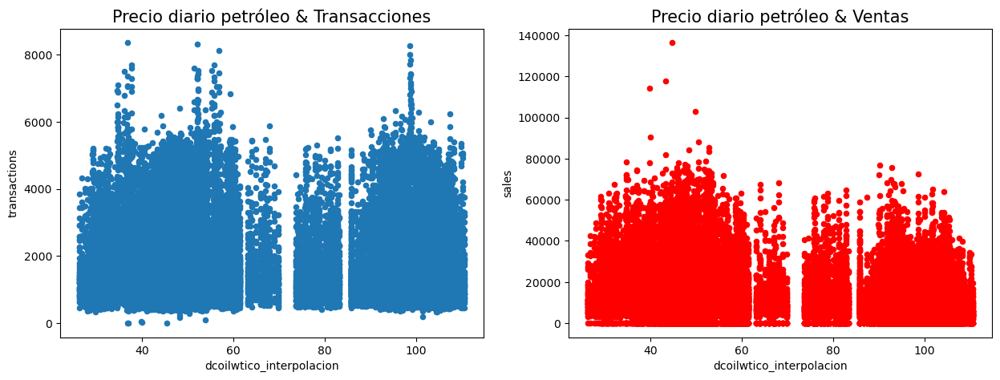

In [33]:
#Correlación precio interpolado petróleo con transacciones & ventas totales

temp = pd.merge(temp, oil, how = "left")
print("Correlation with Daily Oil Prices")
print(temp.drop(["store_nbr", "dcoilwtico"], axis = 1).corr("spearman").dcoilwtico_interpolacion.loc[["sales", "transactions"]], "\n")


fig, axes = plt.subplots(1, 2, figsize = (15,5))
temp.plot.scatter(x = "dcoilwtico_interpolacion", y = "transactions", ax=axes[0])
temp.plot.scatter(x = "dcoilwtico_interpolacion", y = "sales", ax=axes[1], color = "r")
axes[0].set_title('Precio diario petróleo & Transacciones', fontsize = 15)
axes[1].set_title('Precio diario petróleo & Ventas', fontsize = 15);

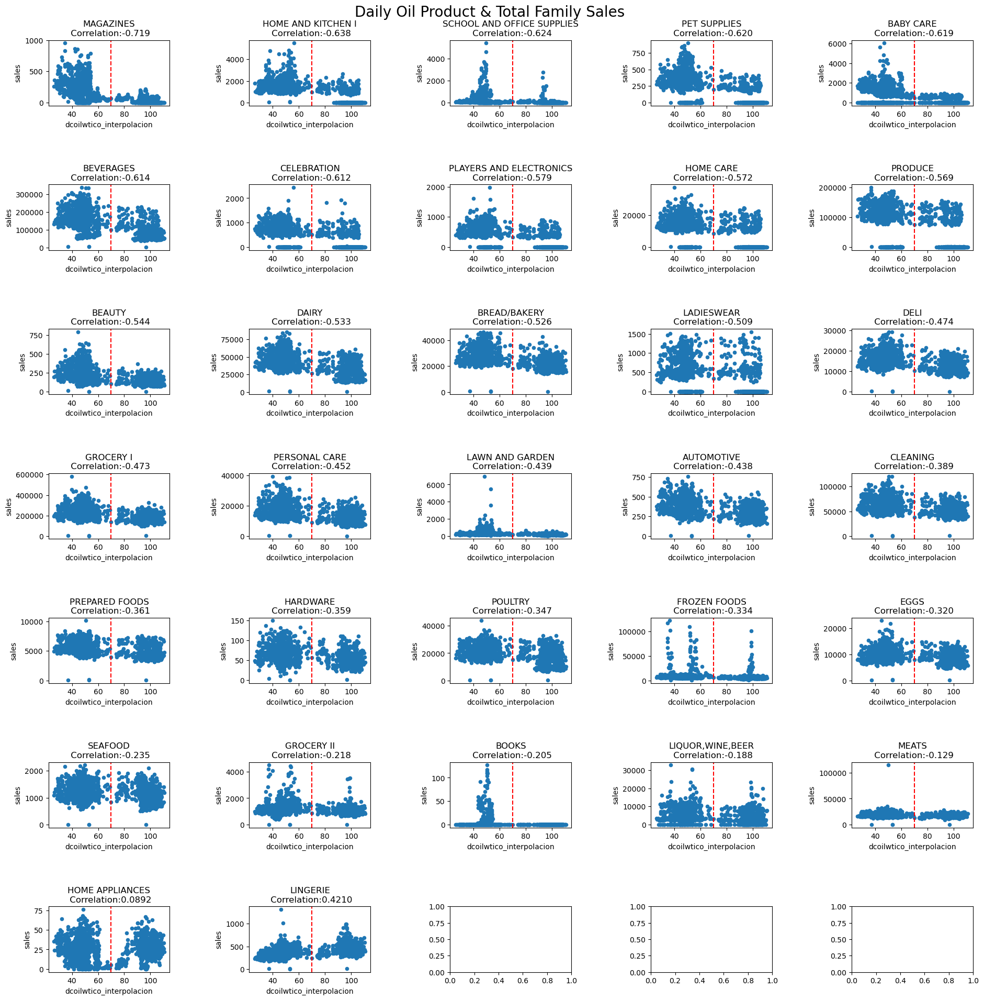

In [34]:
a = pd.merge(train.groupby(["date", "family"]).sales.sum().reset_index(), oil.drop("dcoilwtico", axis = 1), how = "left")
c = a.groupby("family").corr("spearman").reset_index()
c = c[c.level_1 == "dcoilwtico_interpolacion"][["family", "sales"]].sort_values("sales")

fig, axes = plt.subplots(7, 5, figsize = (20,20))
for i, fam in enumerate(c.family):
    if i < 6:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolacion", y = "sales", ax=axes[0, i-1])
        axes[0, i-1].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[0, i-1].axvline(x=70, color='r', linestyle='--')
    if i >= 6 and i<11:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolacion", y = "sales", ax=axes[1, i-6])
        axes[1, i-6].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[1, i-6].axvline(x=70, color='r', linestyle='--')
    if i >= 11 and i<16:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolacion", y = "sales", ax=axes[2, i-11])
        axes[2, i-11].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[2, i-11].axvline(x=70, color='r', linestyle='--')
    if i >= 16 and i<21:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolacion", y = "sales", ax=axes[3, i-16])
        axes[3, i-16].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[3, i-16].axvline(x=70, color='r', linestyle='--')
    if i >= 21 and i<26:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolacion", y = "sales", ax=axes[4, i-21])
        axes[4, i-21].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[4, i-21].axvline(x=70, color='r', linestyle='--')
    if i >= 26 and i < 31:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolacion", y = "sales", ax=axes[5, i-26])
        axes[5, i-26].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[5, i-26].axvline(x=70, color='r', linestyle='--')
    if i >= 31 :
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolacion", y = "sales", ax=axes[6, i-31])
        axes[6, i-31].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[6, i-31].axvline(x=70, color='r', linestyle='--')
        
        
plt.tight_layout(pad=5)
plt.suptitle("Daily Oil Product & Total Family Sales \n", fontsize = 20);
plt.show()

# EDA & Cleaning: Ventas

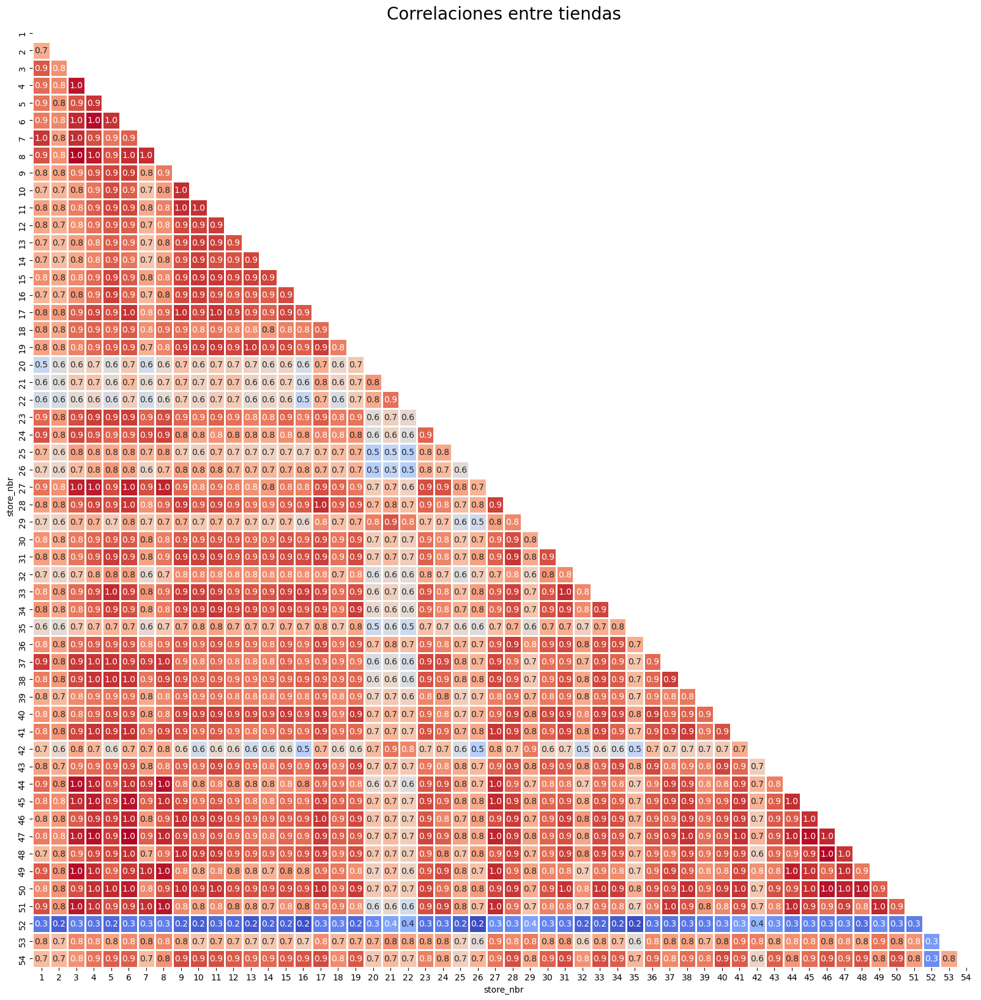

In [35]:
# Matriz de correlación ventas entre tiendas

matriz = train[["store_nbr", "sales"]]
matriz["ind"] = 1
matriz["ind"] = matriz.groupby("store_nbr").ind.cumsum().values
matriz = pd.pivot(matriz, index = "ind", columns = "store_nbr", values = "sales").corr()
mask = np.triu(matriz.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(matriz,
        annot=True,
        fmt='.1f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlaciones entre tiendas",fontsize = 20)
plt.show()

In [36]:
# Remover tiendas sin ventas generales

train = train[~((train.store_nbr == 52) & (train.date < "2017-04-20"))]
train = train[~((train.store_nbr == 22) & (train.date < "2015-10-09"))]
train = train[~((train.store_nbr == 42) & (train.date < "2015-08-21"))]
train = train[~((train.store_nbr == 21) & (train.date < "2015-07-24"))]
train = train[~((train.store_nbr == 29) & (train.date < "2015-03-20"))]
train = train[~((train.store_nbr == 20) & (train.date < "2015-02-13"))]
train = train[~((train.store_nbr == 53) & (train.date < "2014-05-29"))]
train = train[~((train.store_nbr == 36) & (train.date < "2013-05-09"))]

train.shape

(2780316, 6)

In [37]:
#Remover tiendas sin venta por productos

tiendas_sin_venta = train.groupby(["store_nbr", "family"]).sales.sum().reset_index().sort_values(["family","store_nbr"])
tiendas_sin_venta = tiendas_sin_venta[tiendas_sin_venta.sales == 0]
tiendas_sin_venta

,store_nbr,family,sales
1,1,BABY CARE,0.00
397,13,BABY CARE,0.00
727,23,BABY CARE,0.00
1420,44,BABY CARE,0.00
1453,45,BABY CARE,0.00
1486,46,BABY CARE,0.00
1519,47,BABY CARE,0.00
1552,48,BABY CARE,0.00
1585,49,BABY CARE,0.00
1618,50,BABY CARE,0.00


In [38]:
# Creación nuevo df de tiendas sin ventas

print(train.shape)

# Anti Join
outer_join = train.merge(tiendas_sin_venta[tiendas_sin_venta.sales == 0].drop("sales",axis = 1), how = 'outer', indicator = True)
train = outer_join[~(outer_join._merge == 'both')].drop('_merge', axis = 1)
del outer_join
gc.collect()
train.shape

(2780316, 6)


(2698648, 6)

In [39]:
# Forecast de 15 días para las tiendas sin ventas por producto

zero_prediction = []
for i in range(0,len(tiendas_sin_venta)):
    zero_prediction.append(
        pd.DataFrame({
            "date":pd.date_range("2017-08-16", "2017-08-31").tolist(),
            "store_nbr":tiendas_sin_venta.store_nbr.iloc[i],
            "family":tiendas_sin_venta.family.iloc[i],
            "sales":0
        })
    )
zero_prediction = pd.concat(zero_prediction)
del tiendas_sin_venta
gc.collect()
zero_prediction

,date,store_nbr,family,sales
0,2017-08-16,1,BABY CARE,0
1,2017-08-17,1,BABY CARE,0
2,2017-08-18,1,BABY CARE,0
3,2017-08-19,1,BABY CARE,0
4,2017-08-20,1,BABY CARE,0
...,...,...,...,...
11,2017-08-27,54,LAWN AND GARDEN,0
12,2017-08-28,54,LAWN AND GARDEN,0
13,2017-08-29,54,LAWN AND GARDEN,0
14,2017-08-30,54,LAWN AND GARDEN,0


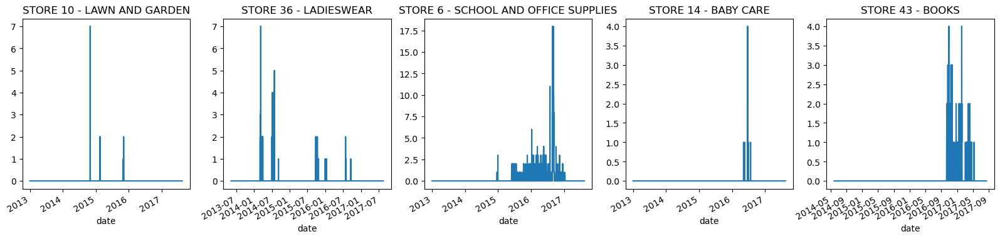

In [40]:
# Productos activos o pasivos por tienda

tiendas_sin_venta = train.groupby(["family", "store_nbr"]).tail(30).groupby(["family", "store_nbr"]).sales.sum().reset_index()
tiendas_sin_venta[tiendas_sin_venta.sales == 0]

#Visualización

fig, ax = plt.subplots(1,5, figsize = (20,4))
train[(train.store_nbr == 10) & (train.family == "LAWN AND GARDEN")].set_index("date").sales.plot(ax = ax[0], title = "STORE 10 - LAWN AND GARDEN")
train[(train.store_nbr == 36) & (train.family == "LADIESWEAR")].set_index("date").sales.plot(ax = ax[1], title = "STORE 36 - LADIESWEAR")
train[(train.store_nbr == 6) & (train.family == "SCHOOL AND OFFICE SUPPLIES")].set_index("date").sales.plot(ax = ax[2], title = "STORE 6 - SCHOOL AND OFFICE SUPPLIES")
train[(train.store_nbr == 14) & (train.family == "BABY CARE")].set_index("date").sales.plot(ax = ax[3], title = "STORE 14 - BABY CARE")
train[(train.store_nbr == 53) & (train.family == "BOOKS")].set_index("date").sales.plot(ax = ax[4], title = "STORE 43 - BOOKS")
plt.show()

In [41]:
# Monto total diario en ventas por producto

ventas_por_producto = train.set_index("date").groupby("family").resample("D").sales.sum().reset_index()
px.line(ventas_por_producto, x = "date", y= "sales", color = "family", title = "Monto total diario en ventas por producto")

In [42]:
ventas_por_producto = train.groupby("family").sales.mean().sort_values(ascending = False).reset_index()
px.bar(ventas_por_producto, y = "family", x="sales", color = "family", title = "Tipo de producto más preferido")


# EDA & Cleaning: Días festivos & Eventos

In [43]:
# Días festivos transferidos

tr1 = holidays[(holidays.type == "Holiday") & (holidays.transferred == True)].drop("transferred", axis = 1).reset_index(drop = True)
tr2 = holidays[(holidays.type == "Transfer")].drop("transferred", axis = 1).reset_index(drop = True)
tr = pd.concat([tr1,tr2], axis = 1)
tr = tr.iloc[:, [5,1,2,3,4]]

holidays = holidays[(holidays.transferred == False) & (holidays.type != "Transfer")].drop("transferred", axis = 1)
holidays = holidays.append(tr).reset_index(drop = True)

# Días festivos adicionales
holidays["description"] = holidays["description"].str.replace("-", "").str.replace("+", "").str.replace('\d+', '')
holidays["type"] = np.where(holidays["type"] == "Additional", "Holiday", holidays["type"])

# Días festivos "Puentes"
holidays["description"] = holidays["description"].str.replace("Puente ", "")
holidays["type"] = np.where(holidays["type"] == "Bridge", "Holiday", holidays["type"])

 
# Días festivos trabajados, esto para saldar el puente
work_day = holidays[holidays.type == "Work Day"]  
holidays = holidays[holidays.type != "Work Day"]

# Segmentación de datos

# Eventos Nacionales
events = holidays[holidays.type == "Event"].drop(["type", "locale", "locale_name"], axis = 1).rename({"description":"events"}, axis = 1)

holidays = holidays[holidays.type != "Event"].drop("type", axis = 1)
regional = holidays[holidays.locale == "Regional"].rename({"locale_name":"state", "description":"holiday_regional"}, axis = 1).drop("locale", axis = 1).drop_duplicates()
national = holidays[holidays.locale == "National"].rename({"description":"holiday_national"}, axis = 1).drop(["locale", "locale_name"], axis = 1).drop_duplicates()
local = holidays[holidays.locale == "Local"].rename({"description":"holiday_local", "locale_name":"city"}, axis = 1).drop("locale", axis = 1).drop_duplicates()



d = pd.merge(train.append(test), stores)
d["store_nbr"] = d["store_nbr"].astype("int8")


# Días festivos nacionales & Eventos
#d = pd.merge(d, events, how = "left")
d = pd.merge(d, national, how = "left")
# Regionales
d = pd.merge(d, regional, how = "left", on = ["date", "state"])
# Locales
d = pd.merge(d, local, how = "left", on = ["date", "city"])

# Día Laborales: Serán removidos cuándo la columna real de día laboral sea creada 
d = pd.merge(d,  work_day[["date", "type"]].rename({"type":"IsWorkDay"}, axis = 1),how = "left")


# Eventos
events["events"] = np.where(events.events.str.contains("futbol"), "Futbol", events.events)

def one_hot_encoder(df, nan_as_category=True):
    original_columns = list(df.columns)
    categorical_columns = df.select_dtypes(["category", "object"]).columns.tolist()
    # categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    df.columns = df.columns.str.replace(" ", "_")
    return df, df.columns.tolist()

events, events_cat = one_hot_encoder(events, nan_as_category=False)
events["events_Dia_de_la_Madre"] = np.where(events.date == "2016-05-08", 1,events["events_Dia_de_la_Madre"])
events = events.drop(239)

d = pd.merge(d, events, how = "left")
d[events_cat] = d[events_cat].fillna(0)

# Caracteristicas
d["holiday_national_binary"] = np.where(d.holiday_national.notnull(), 1, 0)
d["holiday_local_binary"] = np.where(d.holiday_local.notnull(), 1, 0)
d["holiday_regional_binary"] = np.where(d.holiday_regional.notnull(), 1, 0)

# 
d["national_independence"] = np.where(d.holiday_national.isin(['Batalla de Pichincha',  'Independencia de Cuenca', 'Independencia de Guayaquil', 'Independencia de Guayaquil', 'Primer Grito de Independencia']), 1, 0)
d["local_cantonizacio"] = np.where(d.holiday_local.str.contains("Cantonizacio"), 1, 0)
d["local_fundacion"] = np.where(d.holiday_local.str.contains("Fundacion"), 1, 0)
d["local_independencia"] = np.where(d.holiday_local.str.contains("Independencia"), 1, 0)


holidays, holidays_cat = one_hot_encoder(d[["holiday_national","holiday_regional","holiday_local"]], nan_as_category=False)
d = pd.concat([d.drop(["holiday_national","holiday_regional","holiday_local"], axis = 1),holidays], axis = 1)

he_cols = d.columns[d.columns.str.startswith("events")].tolist() + d.columns[d.columns.str.startswith("holiday")].tolist() + d.columns[d.columns.str.startswith("national")].tolist()+ d.columns[d.columns.str.startswith("local")].tolist()
d[he_cols] = d[he_cols].astype("int8")

d[["family", "city", "state", "type"]] = d[["family", "city", "state", "type"]].astype("category")

del holidays, holidays_cat, work_day, local, regional, national, events, events_cat, tr, tr1, tr2, he_cols
gc.collect()

d.head(10)

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,IsWorkDay,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1782,2013-01-02,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,3564,2013-01-03,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,5346,2013-01-04,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,7128,2013-01-05,1,AUTOMOTIVE,5.00,0.00,Quito,Pichincha,D,13,Work Day,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,8910,2013-01-06,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,10692,2013-01-07,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,12474,2013-01-08,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,14256,2013-01-09,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,16038,2013-01-10,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,NaN,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [44]:
# Caracteristicas relacionadas a estacionalidades 

def create_date_features(df):
    df['month'] = df.date.dt.month.astype("int8")
    df['day_of_month'] = df.date.dt.day.astype("int8")
    df['day_of_year'] = df.date.dt.dayofyear.astype("int16")
    df['week_of_month'] = (df.date.apply(lambda d: (d.day-1) // 7 + 1)).astype("int8")
    df['week_of_year'] = (df.date.dt.weekofyear).astype("int8")
    df['day_of_week'] = (df.date.dt.dayofweek + 1).astype("int8")
    df['year'] = df.date.dt.year.astype("int32")
    df["is_wknd"] = (df.date.dt.weekday // 4).astype("int8")
    df["quarter"] = df.date.dt.quarter.astype("int8")
    df['is_month_start'] = df.date.dt.is_month_start.astype("int8")
    df['is_month_end'] = df.date.dt.is_month_end.astype("int8")
    df['is_quarter_start'] = df.date.dt.is_quarter_start.astype("int8")
    df['is_quarter_end'] = df.date.dt.is_quarter_end.astype("int8")
    df['is_year_start'] = df.date.dt.is_year_start.astype("int8")
    df['is_year_end'] = df.date.dt.is_year_end.astype("int8")
    # 0: Invierno - 1: Primavera - 2: Verano - 3: Otonio
    df["season"] = np.where(df.month.isin([12,1,2]), 0, 1)
    df["season"] = np.where(df.month.isin([6,7,8]), 2, df["season"])
    df["season"] = pd.Series(np.where(df.month.isin([9, 10, 11]), 3, df["season"])).astype("int8")
    return df
d = create_date_features(d)




# Columna día de trabajo
d["workday"] = np.where((d.holiday_national_binary == 1) | (d.holiday_local_binary==1) | (d.holiday_regional_binary==1) | (d['day_of_week'].isin([6,7])), 0, 1)
d["workday"] = pd.Series(np.where(d.IsWorkDay.notnull(), 1, d["workday"])).astype("int8")
d.drop("IsWorkDay", axis = 1, inplace = True)

# Días de pago en el sector público son pagados cada 15 días. En el 15 y día último de cada mes
# Súpermercados podrían verse afectados por esto.
d["wageday"] = pd.Series(np.where((d['is_month_end'] == 1) | (d["day_of_month"] == 15), 1, 0)).astype("int8")

d.head(15)

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga,month,day_of_month,day_of_year,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,0,0
1,1782,2013-01-02,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2,1,1,3,2013,0,1,0,0,0,0,0,0,0,1,0
2,3564,2013-01-03,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,3,1,1,4,2013,0,1,0,0,0,0,0,0,0,1,0
3,5346,2013-01-04,1,AUTOMOTIVE,3.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4,4,1,1,5,2013,1,1,0,0,0,0,0,0,0,1,0
4,7128,2013-01-05,1,AUTOMOTIVE,5.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,5,5,1,1,6,2013,1,1,0,0,0,0,0,0,0,1,0
5,8910,2013-01-06,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,6,6,1,1,7,2013,1,1,0,0,0,0,0,0,0,0,0
6,10692,2013-01-07,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,7,7,1,2,1,2013,0,1,0,0,0,0,0,0,0,1,0
7,12474,2013-01-08,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,8,8,2,2,2,2013,0,1,0,0,0,0,0,0,0,1,0
8,14256,2013-01-09,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,9,9,2,2,3,2013,0,1,0,0,0,0,0,0,0,1,0
9,16038,2013-01-10,1,AUTOMOTIVE,2.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,10,10,2,2,4,2013,0,1,0,0,0,0,0,0,0,1,0


¿Terremoto afectó las ventas en tiendas?. Comparar promedio de ventas por año, mes y tipo de producto es un buen método para entender cómo afectó el evento a las ventas.

In [45]:
# Promedio de ventas abril y mayo por año 

d[(d.month.isin([4,5]))].groupby(["year"]).sales.mean()

year
2013   249.38
2014   285.53
2015   334.68
2016   489.90
2017   503.50
Name: sales, dtype: float32

In [46]:
# Pivot de ventas por tipo de producto y año en los meses de marzo

pd.pivot_table(d[(d.month.isin([3]))], index="year", columns="family", values="sales", aggfunc="mean")

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HARDWARE,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME APPLIANCES,HOME CARE,LADIESWEAR,LAWN AND GARDEN,LINGERIE,"LIQUOR,WINE,BEER",MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013,5.35,0.00,2.74,1277.85,0.00,416.57,0.00,1055.67,429.53,229.49,157.80,95.06,3281.80,20.69,1.11,0.00,0.00,0.80,0.00,0.00,3.31,9.33,74.50,0.00,368.54,223.88,0.00,0.00,223.56,106.08,2.83,0.00,28.10
2014,6.94,0.06,3.55,3040.63,0.00,446.92,14.74,1215.01,815.26,261.29,189.67,138.42,3807.03,21.25,1.50,23.82,12.52,0.71,297.74,16.65,5.63,8.49,95.85,1.34,382.59,265.75,5.50,11.02,449.17,112.42,2300.86,1.53,27.45
2015,7.55,0.00,2.78,1515.37,0.00,547.43,0.00,1219.26,806.57,329.61,209.24,129.68,4016.91,23.82,1.13,24.85,18.66,0.85,0.00,0.00,5.35,6.52,91.09,0.00,356.97,316.62,0.00,0.00,420.88,104.59,4.51,0.00,28.61
2016,7.34,0.34,4.34,3023.50,0.00,501.95,14.23,1077.72,859.32,277.81,177.58,131.25,4088.61,19.78,1.32,26.11,25.67,0.31,267.45,13.88,5.35,4.92,89.79,6.07,330.77,296.47,5.89,8.72,374.97,109.86,2304.82,1.96,23.89
2017,7.79,0.34,4.29,3733.14,0.59,584.24,14.21,1220.11,991.14,326.49,199.83,130.17,4800.77,22.14,1.45,29.23,29.95,0.71,319.10,14.74,15.97,6.88,89.70,6.28,374.28,331.43,8.79,11.39,395.35,114.03,2442.19,5.02,25.54


In [47]:
# Pivot de las ventas por tipo de producto y año en los meses de abril y mayo

pd.pivot_table(d[(d.month.isin([4,5]))], index="year", columns="family", values="sales", aggfunc="mean")

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HARDWARE,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME APPLIANCES,HOME CARE,LADIESWEAR,LAWN AND GARDEN,LINGERIE,"LIQUOR,WINE,BEER",MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013,5.84,0.00,2.61,1260.96,0.00,418.76,0.00,1027.76,408.36,234.52,154.75,104.79,3308.63,21.95,1.01,0.00,0.00,0.75,0.00,0.00,3.23,9.39,71.10,0.00,377.75,224.65,0.00,0.00,221.59,96.68,5.35,0.00,25.37
2014,5.75,0.00,2.61,1461.64,0.00,416.34,0.00,1028.08,766.63,253.55,184.63,121.35,3614.11,21.44,1.02,0.00,0.00,0.56,0.00,0.00,4.98,8.94,85.83,0.00,361.61,266.44,0.00,0.00,405.27,103.47,5.66,0.00,23.63
2015,6.02,0.00,2.96,1915.16,0.00,551.60,0.00,1227.91,811.31,329.80,198.89,139.64,3989.90,26.46,1.06,26.11,20.73,0.65,127.72,0.00,5.47,8.20,95.21,1.69,365.24,314.39,0.06,0.00,415.49,102.44,5.68,0.00,27.05
2016,7.26,0.32,4.87,3369.27,0.00,551.90,14.25,1218.35,911.86,299.28,186.11,135.95,4898.71,22.04,1.36,27.10,28.28,0.45,315.92,14.96,5.47,6.24,82.89,6.77,363.50,363.47,6.84,10.67,399.37,108.67,2305.70,5.99,24.55
2017,7.63,0.23,5.30,3592.94,0.26,557.84,13.72,1308.01,970.85,323.21,202.54,138.61,4841.85,26.12,1.55,30.31,31.31,0.71,304.85,15.40,19.17,7.83,90.16,6.87,362.41,326.00,9.07,12.22,385.39,96.31,2404.91,11.71,23.17


In [48]:
# Pivot de las ventas por tipo de producto y año en el mes de junio

pd.pivot_table(d[(d.month.isin([6]))], index="year", columns="family", values="sales", aggfunc="mean")

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,EGGS,FROZEN FOODS,GROCERY I,GROCERY II,HARDWARE,HOME AND KITCHEN I,HOME AND KITCHEN II,HOME APPLIANCES,HOME CARE,LADIESWEAR,LAWN AND GARDEN,LINGERIE,"LIQUOR,WINE,BEER",MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013,5.89,0.00,2.72,1297.24,0.00,431.05,0.00,1052.44,419.08,238.23,156.45,120.79,3489.13,21.83,0.95,0.00,0.00,0.71,0.00,0.00,3.43,8.85,75.67,0.00,389.95,216.12,0.00,0.00,232.16,100.72,6.12,0.00,20.99
2014,5.72,0.00,2.46,1458.94,0.00,450.82,0.00,1029.45,757.82,260.01,182.69,122.18,3655.15,22.99,1.03,0.00,0.00,0.41,0.00,0.00,4.35,8.60,94.37,0.00,383.37,270.10,0.00,0.00,409.03,101.04,5.75,0.00,23.97
2015,6.52,0.18,3.79,3178.15,0.00,549.95,14.74,1177.30,829.06,328.15,196.27,139.39,3903.51,25.12,1.30,26.92,31.28,0.12,288.21,16.89,5.27,7.83,101.28,1.53,376.68,297.36,5.87,8.72,411.02,108.23,2346.14,1.33,25.85
2016,6.25,0.35,4.55,2806.97,0.00,550.81,13.96,1108.43,863.92,280.66,182.98,129.32,4170.43,21.84,1.08,28.62,25.08,0.29,260.83,14.07,5.66,4.43,85.12,5.67,350.66,292.74,5.95,8.50,373.23,104.96,2239.03,1.55,23.18
2017,7.38,0.23,5.43,3580.13,0.08,555.64,13.80,1228.70,932.53,317.70,202.11,137.49,4702.43,29.26,1.40,33.93,30.85,0.64,286.55,14.65,17.85,6.78,95.40,6.19,388.38,319.44,9.22,11.34,406.58,90.90,2403.45,1.58,19.36


# Prueba hipótesis Augmented Dickey-Fuller (ADF) test

In [49]:
# Dataframe segmentando un muestreo con datos del anio 2016 solamente 

d_ADF = d[(d['year'] == 2016)]
d_ADF

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga,month,day_of_month,day_of_year,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday
1092,1945944,2016-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,53,5,2016,1,1,1,0,1,0,1,0,0,0,0
1093,1947726,2016-01-02,1,AUTOMOTIVE,7.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2,1,53,6,2016,1,1,0,0,0,0,0,0,0,0,0
1094,1949508,2016-01-03,1,AUTOMOTIVE,1.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,3,1,53,7,2016,1,1,0,0,0,0,0,0,0,0,0
1095,1951290,2016-01-04,1,AUTOMOTIVE,8.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4,4,1,1,1,2016,0,1,0,0,0,0,0,0,0,1,0
1096,1953072,2016-01-05,1,AUTOMOTIVE,7.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,5,5,1,1,2,2016,0,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2722214,2587958,2016-12-27,22,SEAFOOD,2.00,0.00,Puyo,Pastaza,C,7,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,27,362,4,52,2,2016,0,4,0,0,0,0,0,0,0,1,0
2722215,2589740,2016-12-28,22,SEAFOOD,1.00,0.00,Puyo,Pastaza,C,7,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,28,363,4,52,3,2016,0,4,0,0,0,0,0,0,0,1,0
2722216,2591522,2016-12-29,22,SEAFOOD,2.00,0.00,Puyo,Pastaza,C,7,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,29,364,5,52,4,2016,0,4,0,0,0,0,0,0,0,1,0
2722217,2593304,2016-12-30,22,SEAFOOD,0.00,0.00,Puyo,Pastaza,C

In [50]:
# Técnica de diferenciación 

d_ADF['diff_sales'] = d['sales'].diff()
d_ADF

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga,month,day_of_month,day_of_year,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday,diff_sales
1092,1945944,2016-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,53,5,2016,1,1,1,0,1,0,1,0,0,0,0,-5.00
1093,1947726,2016-01-02,1,AUTOMOTIVE,7.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2,1,53,6,2016,1,1,0,0,0,0,0,0,0,0,0,7.00
1094,1949508,2016-01-03,1,AUTOMOTIVE,1.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,3,1,53,7,2016,1,1,0,0,0,0,0,0,0,0,0,-6.00
1095,1951290,2016-01-04,1,AUTOMOTIVE,8.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4,4,1,1,1,2016,0,1,0,0,0,0,0,0,0,1,0,7.00
1096,1953072,2016-01-05,1,AUTOMOTIVE,7.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,5,5,1,1,2,2016,0,1,0,0,0,0,0,0,0,1,0,-1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2722214,2587958,2016-12-27,22,SEAFOOD,2.00,0.00,Puyo,Pastaza,C,7,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,27,362,4,52,2,2016,0,4,0,0,0,0,0,0,0,1,0,1.00
2722215,2589740,2016-12-28,22,SEAFOOD,1.00,0.00,Puyo,Pastaza,C,7,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,28,363,4,52,3,2016,0,4,0,0,0,0,0,0,0,1,0,-1.00
2722216,2591522,2016-12-29,22,SEAFOOD,2.00,0.00,Puyo,Pastaza,C,7,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,29,364,5,52,4,2016,0,4,0,0,0,0,0,0,0,1,0,1.00
272

In [51]:
d_ADF = d_ADF.dropna()
d_ADF['diff_sales']

1092      -5.00
1093       7.00
1094      -6.00
1095       7.00
1096      -1.00
           ... 
2722214    1.00
2722215   -1.00
2722216    1.00
2722217   -2.00
2722218    0.00
Name: diff_sales, Length: 619770, dtype: float32

In [52]:
d_ADF['diff_sales'] = d['sales'] - d['sales'].shift(1)
d_ADF

,id,date,store_nbr,family,sales,onpromotion,city,state,type,cluster,events_Black_Friday,events_Cyber_Monday,events_Dia_de_la_Madre,events_Futbol,events_Terremoto_Manabi,holiday_national_binary,holiday_local_binary,holiday_regional_binary,national_independence,local_cantonizacio,local_fundacion,local_independencia,holiday_national_Batalla_de_Pichincha,holiday_national_Carnaval,holiday_national_Dia_de_Difuntos,holiday_national_Dia_de_la_Madre,holiday_national_Dia_del_Trabajo,holiday_national_Independencia_de_Cuenca,holiday_national_Independencia_de_Guayaquil,holiday_national_Navidad,holiday_national_Primer_Grito_de_Independencia,holiday_national_Primer_dia_del_ano,holiday_national_Viernes_Santo,holiday_regional_Provincializacion_Santa_Elena,holiday_regional_Provincializacion_de_Cotopaxi,holiday_regional_Provincializacion_de_Imbabura,holiday_regional_Provincializacion_de_Santo_Domingo,holiday_local_Cantonizacion_de_Cayambe,holiday_local_Cantonizacion_de_El_Carmen,holiday_local_Cantonizacion_de_Guaranda,holiday_local_Cantonizacion_de_Latacunga,holiday_local_Cantonizacion_de_Libertad,holiday_local_Cantonizacion_de_Quevedo,holiday_local_Cantonizacion_de_Riobamba,holiday_local_Cantonizacion_de_Salinas,holiday_local_Cantonizacion_del_Puyo,holiday_local_Fundacion_de_Ambato,holiday_local_Fundacion_de_Cuenca,holiday_local_Fundacion_de_Esmeraldas,holiday_local_Fundacion_de_Guayaquil,holiday_local_Fundacion_de_Ibarra,holiday_local_Fundacion_de_Loja,holiday_local_Fundacion_de_Machala,holiday_local_Fundacion_de_Manta,holiday_local_Fundacion_de_Quito,holiday_local_Fundacion_de_Riobamba,holiday_local_Fundacion_de_Santo_Domingo,holiday_local_Independencia_de_Ambato,holiday_local_Independencia_de_Guaranda,holiday_local_Independencia_de_Latacunga,month,day_of_month,day_of_year,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,workday,wageday,diff_sales
1092,1945944,2016-01-01,1,AUTOMOTIVE,0.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,53,5,2016,1,1,1,0,1,0,1,0,0,0,0,-5.00
1093,1947726,2016-01-02,1,AUTOMOTIVE,7.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,2,1,53,6,2016,1,1,0,0,0,0,0,0,0,0,0,7.00
1094,1949508,2016-01-03,1,AUTOMOTIVE,1.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,3,1,53,7,2016,1,1,0,0,0,0,0,0,0,0,0,-6.00
1095,1951290,2016-01-04,1,AUTOMOTIVE,8.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4,4,1,1,1,2016,0,1,0,0,0,0,0,0,0,1,0,7.00
1096,1953072,2016-01-05,1,AUTOMOTIVE,7.00,0.00,Quito,Pichincha,D,13,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,5,5,1,1,2,2016,0,1,0,0,0,0,0,0,0,1,0,-1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2722214,2587958,2016-12-27,22,SEAFOOD,2.00,0.00,Puyo,Pastaza,C,7,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,27,362,4,52,2,2016,0,4,0,0,0,0,0,0,0,1,0,1.00
2722215,2589740,2016-12-28,22,SEAFOOD,1.00,0.00,Puyo,Pastaza,C,7,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,28,363,4,52,3,2016,0,4,0,0,0,0,0,0,0,1,0,-1.00
2722216,2591522,2016-12-29,22,SEAFOOD,2.00,0.00,Puyo,Pastaza,C,7,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,29,364,5,52,4,2016,0,4,0,0,0,0,0,0,0,1,0,1.00
272

In [53]:
ts = d_ADF['diff_sales']
ts

1092      -5.00
1093       7.00
1094      -6.00
1095       7.00
1096      -1.00
           ... 
2722214    1.00
2722215   -1.00
2722216    1.00
2722217   -2.00
2722218    0.00
Name: diff_sales, Length: 619770, dtype: float32

In [54]:
# Realizar prueba ADF
result = adfuller(ts)

# Extraer y mostrar las estadisticas de la prueba y el p-value 
adf_statistic = result[0]
p_value = result[1]
print("ADF Statistic:", adf_statistic)
print("p-value:", p_value)

ADF Statistic: -86.80430010777347
p-value: 0.0


# Prueba hipótesis Kwiatkowski-Phillips-Schmidt-Shin (KPSS)

In [55]:
# Realizar prueba KPSS
result = kpss(ts)

# Extraer y mostrar las estadisticas de la prueba y el p-value 
kpss_statistic = result[1]
p_value = result[0]
print("KPSS Statistic:", kpss_statistic)
print("p-value:", p_value)

KPSS Statistic: 0.09403621769929557
p-value: 0.36083597493763425


# ACF & PACF por tipo de producto

In [56]:
# Autocorrelation function & Partial autocorrelation function

#a = d[d["store_nbr"]==1].set_index("date")
a = d[(d.sales.notnull())].groupby(["date", "family"]).sales.mean().reset_index().set_index("date")
#for num, i in enumerate(a.family.unique()):
 #   try:
  #      fig, ax = plt.subplots(1,2,figsize=(15,5))
   #     temp = a[(a.family == i)]#& (a.sales.notnull())
    #    sm.graphics.tsa.plot_acf(temp.sales, lags=365, ax=ax[0], title = "AUTOCORRELATION\n" + i)
     #   sm.graphics.tsa.plot_pacf(temp.sales, lags=365, ax=ax[1], title = "PARTIAL AUTOCORRELATION\n" + i)
    #except:
     #   pass

# Simple Moving Average

In [57]:
# Dataframe mostrando la correlación de ventas con las tiendas, tipo de producto y fechas. Con lags de 16,30 y 60 días al futuro.

a = train.sort_values(["store_nbr", "family", "date"])
for i in [20, 30, 45, 60, 90, 120, 365, 730]:
    a["SMA"+str(i)+"_sales_lag16"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(16).values
    a["SMA"+str(i)+"_sales_lag30"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(30).values
    a["SMA"+str(i)+"_sales_lag60"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(60).values
print("Correlation")
a[["sales"]+a.columns[a.columns.str.startswith("SMA")].tolist()].corr()

Correlation


,sales,SMA20_sales_lag16,SMA20_sales_lag30,SMA20_sales_lag60,SMA30_sales_lag16,SMA30_sales_lag30,SMA30_sales_lag60,SMA45_sales_lag16,SMA45_sales_lag30,SMA45_sales_lag60,SMA60_sales_lag16,SMA60_sales_lag30,SMA60_sales_lag60,SMA90_sales_lag16,SMA90_sales_lag30,SMA90_sales_lag60,SMA120_sales_lag16,SMA120_sales_lag30,SMA120_sales_lag60,SMA365_sales_lag16,SMA365_sales_lag30,SMA365_sales_lag60,SMA730_sales_lag16,SMA730_sales_lag30,SMA730_sales_lag60
sales,1.00,0.91,0.89,0.87,0.91,0.89,0.87,0.91,0.90,0.87,0.91,0.89,0.87,0.91,0.89,0.87,0.90,0.89,0.86,0.90,0.89,0.87,0.91,0.89,0.86
SMA20_sales_lag16,0.91,1.00,0.99,0.95,1.00,0.98,0.95,0.99,0.98,0.95,0.99,0.98,0.95,0.99,0.98,0.95,0.98,0.97,0.95,0.97,0.97,0.95,0.98,0.98,0.95
SMA20_sales_lag30,0.89,0.99,1.00,0.96,0.99,1.00,0.96,1.00,0.99,0.97,0.99,0.99,0.97,0.99,0.99,0.96,0.99,0.98,0.96,0.97,0.97,0.96,0.98,0.98,0.96
SMA20_sales_lag60,0.87,0.95,0.96,1.00,0.96,0.98,1.00,0.98,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.98,0.98,0.97,0.97,0.98,0.98,0.98
SMA30_sales_lag16,0.91,1.00,0.99,0.96,1.00,0.99,0.96,1.00,0.99,0.96,0.99,0.99,0.96,0.99,0.98,0.96,0.99,0.98,0.96,0.98,0.97,0.96,0.98,0.98,0.96
SMA30_sales_lag30,0.89,0.98,1.00,0.98,0.99,1.00,0.98,1.00,1.00,0.98,1.00,0.99,0.98,0.99,0.99,0.97,0.99,0.99,0.97,0.98,0.98,0.97,0.98,0.98,0.98
SMA30_sales_lag60,0.87,0.95,0.96,1.00,0.96,0.98,1.00,0.98,0.99,1.00,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.99,0.98,0.98,0.98,0.98,0.98,0.98
SMA45_sales_lag16,0.91,0.99,1.00,0.98,1.00,1.00,0.98,1.00,1.00,0.98,1.00,0.99,0.98,0.99,0.99,0.98,0.99,0.99,0.97,0.98,0.98,0.97,0.98,0.98,0.98
SMA45_sales_lag30,0.90,0.98,0.99,0.99,0.99,1.00,0.99,1.00,1.00,0.99,1.00,1.00,0.99,1.00,0.99,0.98,0.99,0.99,0.98,0.98,0.98,0.98,0.98,0.98,0.98
SMA45_sales_lag60,0.87,0.95,0.97,0.99,0.96,0.98,1.00,0.98,0.99,1.00,0.99,0.99,1.00,0.99,1.00,0.99,0.99,0.99,0.99,0.98,0.98,0.98,0.98,0.98,0.98


# Exponential Moving Average

In [58]:
# Función para calcular caracteristicas de media móvil exponencial ponderada. Útil para capturar patrones de tendencia y suavizar datos antes de realizar un análisis o predicción.

def ewm_features(dataframe, alphas, lags):
    dataframe = dataframe.copy()
    for alpha in alphas:
        for lag in lags:
            dataframe['sales_ewm_alpha_' + str(alpha).replace(".", "") + "_lag_" + str(lag)] = \
                dataframe.groupby(["store_nbr", "family"])['sales']. \
                    transform(lambda x: x.shift(lag).ewm(alpha=alpha).mean())
    return dataframe

alphas = [0.95, 0.9, 0.8, 0.7, 0.5]
lags = [16, 30, 60, 90]

a = ewm_features(a, alphas, lags)

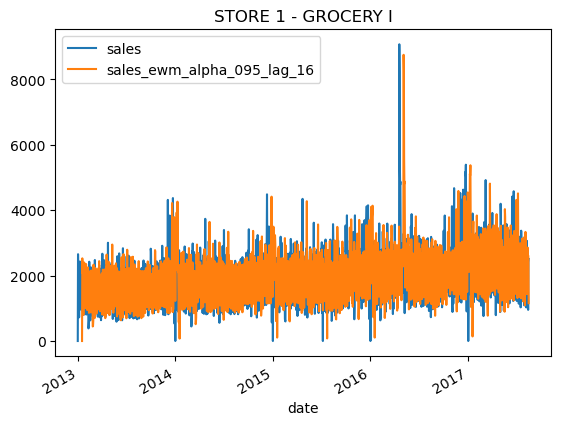

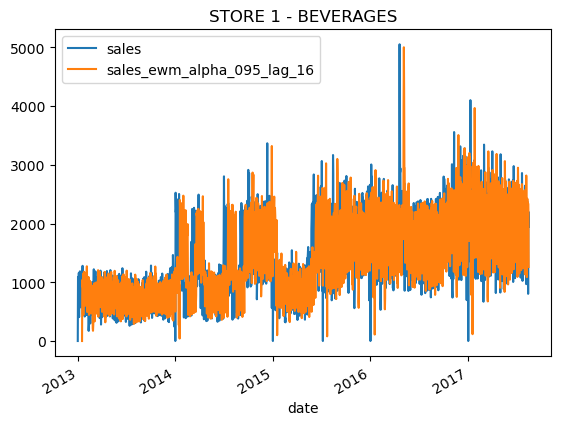

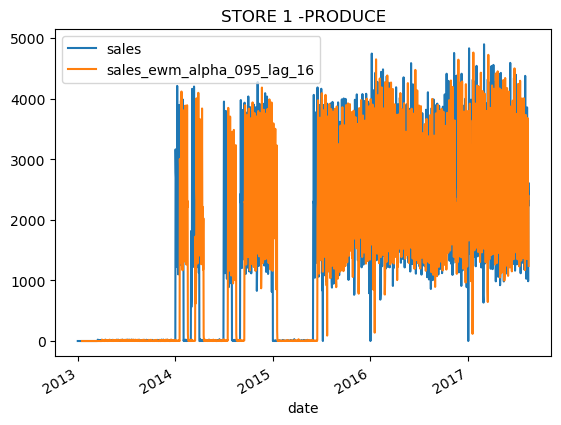

In [59]:
# Visualización de ventas reales con las ventas calculadas (EWMA) para una tienda específica y una categoría de productos específica.

a[(a.store_nbr == 1) & (a.family == "GROCERY I")].set_index("date")[["sales", "sales_ewm_alpha_095_lag_16"]].plot(title = "STORE 1 - GROCERY I");
a[(a.store_nbr == 1) & (a.family == "BEVERAGES")].set_index("date")[["sales", "sales_ewm_alpha_095_lag_16"]].plot(title = "STORE 1 - BEVERAGES");
a[(a.store_nbr == 1) & (a.family == "PRODUCE")].set_index("date")[["sales", "sales_ewm_alpha_095_lag_16"]].plot(title = "STORE 1 -PRODUCE");

# Predicción de ventas con PROPHET

In [60]:
# Agregar caracteristicas de fechas en dataframe

a_df = a['month'] = a.date.dt.month.astype("int8")
a_df = a['year'] = a.date.dt.year.astype("int32")
a_df = a['week_of_month'] = (a.date.apply(lambda a: (a.day-1) // 7 + 1)).astype("int8")
a_df = a['week_of_year'] = a.date.dt.weekofyear.astype("int32")
a_df = a['season'] = np.where(a.month.isin([12,1,2]),0,1)
a_df = a['season'] = np.where(a.month.isin([6,7,8]),2,a["season"])
a_df = a['season'] = pd.Series(np.where(a.month.isin([9,10,11]),3,a["season"])).astype("int8")
a_df

0          0
1          0
2          0
3          0
4          0
          ..
2698643    2
2698644    2
2698645    2
2698646    2
2698647    2
Length: 2698648, dtype: int8

In [61]:
# Reducción de datos a una sola tienda y producto

a_df  = a[(a['store_nbr'] == 1) & (a['family'] == "GROCERY I")]
a_df

,id,date,store_nbr,family,sales,onpromotion,SMA20_sales_lag16,SMA20_sales_lag30,SMA20_sales_lag60,SMA30_sales_lag16,SMA30_sales_lag30,SMA30_sales_lag60,SMA45_sales_lag16,SMA45_sales_lag30,SMA45_sales_lag60,SMA60_sales_lag16,SMA60_sales_lag30,SMA60_sales_lag60,SMA90_sales_lag16,SMA90_sales_lag30,SMA90_sales_lag60,SMA120_sales_lag16,SMA120_sales_lag30,SMA120_sales_lag60,SMA365_sales_lag16,SMA365_sales_lag30,SMA365_sales_lag60,SMA730_sales_lag16,SMA730_sales_lag30,SMA730_sales_lag60,sales_ewm_alpha_095_lag_16,sales_ewm_alpha_095_lag_30,sales_ewm_alpha_095_lag_60,sales_ewm_alpha_095_lag_90,sales_ewm_alpha_09_lag_16,sales_ewm_alpha_09_lag_30,sales_ewm_alpha_09_lag_60,sales_ewm_alpha_09_lag_90,sales_ewm_alpha_08_lag_16,sales_ewm_alpha_08_lag_30,sales_ewm_alpha_08_lag_60,sales_ewm_alpha_08_lag_90,sales_ewm_alpha_07_lag_16,sales_ewm_alpha_07_lag_30,sales_ewm_alpha_07_lag_60,sales_ewm_alpha_07_lag_90,sales_ewm_alpha_05_lag_16,sales_ewm_alpha_05_lag_30,sales_ewm_alpha_05_lag_60,sales_ewm_alpha_05_lag_90,month,year,week_of_month,week_of_year,season
20208,12,2013-01-01,1,GROCERY I,0.00,0.00,128.37,122.03,137.20,123.97,117.82,128.73,122.28,122.76,126.02,126.08,123.28,120.96,123.75,119.91,115.54,118.36,116.11,111.15,132.99,132.33,131.80,141.72,141.26,141.48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2013,1,1,0.00
20209,1794,2013-01-02,1,GROCERY I,2652.00,0.00,127.36,122.01,131.92,126.81,120.17,126.63,121.71,122.64,124.96,124.44,123.40,120.01,123.86,120.06,114.89,118.44,116.21,110.75,133.27,132.52,131.50,141.72,141.20,141.30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2013,1,1,0.00
20210,3576,2013-01-03,1,GROCERY I,2121.00,0.00,129.78,121.58,136.11,129.67,120.02,128.44,124.91,125.24,125.36,125.58,124.23,120.60,124.94,120.41,115.41,119.42,116.56,111.51,133.60,132.66,131.45,141.81,141.24,141.38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2013,1,1,0.00
20211,5358,2013-01-04,1,GROCERY I,2056.00,0.00,129.11,122.51,132.36,129.56,121.08,129.90,124.38,124.13,124.49,127.21,125.49,119.73,124.87,120.18,115.25,119.57,116.71,111.61,133.76,132.71,131.51,141.83,141.35,141.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2013,1,1,0.00
20212,7140,2013-01-05,1,GROCERY I,2216.00,0.00,130.19,123.76,135.37,128.99,120.44,130.77,125.48,125.13,127.47,126.67,125.60,120.30,124.98,120.35,115.79,119.63,116.95,112.49,133.86,132.86,131.73,141.87,141.43,141.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2013,1,1,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21887,2991990,2017-08-11,1,GROCERY I,1270.00,24.00,2540.55,2585.55,2598.65,2582.90,2743.73,2545.00,2673.44,2744.02,2564.60,2668.85,2644.37,2527.52,2622.08,2599.59,2625.60,2618.81,2655.13,2645.74,2608.17,2602.13,2570.73,2520.71,2513.59,2489.02,2854.72,3161.49,2542.93,2957.89,2831.65,3137.51,2493.62,2978.79,2783.73,3084.59,2421.17,3004.46,2731.35,3021.59,2383.45,3011.08,2618.76,2866.81,2410.29,2972.51,8,2017,2,32,2.00
21888,2993772,2017-08-12,1,GROCERY I,1630.00,28.00,2515.25,2580.95,2541.25,2576.67,2748.57,2594.83,2670.44,2741.91,2564.60,2688.98,2671.70,2554.78,2617.52,2619.38,2618.14,2613.49,2650.75,2638.82,2608.27,2603.00,2574.14,2522.90,2515.86,2489.18,2485.44,2600.52,2431.85,1032.34,2502.57,2627.65,2432.76,1135.78,2529.55,2673.72,2425.03,1345.69,2545.61,2706.18,2413.23,1555.03,2542.38,2718.91,2418.14,1951.75,8,2017,2,32,2.00
21889,2995554,2017-08-13,1,GROCERY I,952.00,19.00,2518.30,2596.20,2636.55,2563.97,2707.60,2657.50,2674.80,2757.13,2642.93,2688.25,2682.55,2594.47,2619.70,2632.18,2634.57,2614.03,2652.82,2651.84,2607.67,2603.62,2579.72,2523.22,2516.89,2492.01,2615.17,3152.93,4312.04,2456.07,2610.06,3126.57,4213.18,2391.48,2603.51,3080.34,4013.81,22

In [62]:
(a_df.isnull().sum() / a_df.shape[0]).round(2)

id                           0.00
date                         0.00
store_nbr                    0.00
family                       0.00
sales                        0.00
onpromotion                  0.00
SMA20_sales_lag16            0.01
SMA20_sales_lag30            0.01
SMA20_sales_lag60            0.01
SMA30_sales_lag16            0.02
SMA30_sales_lag30            0.02
SMA30_sales_lag60            0.02
SMA45_sales_lag16            0.03
SMA45_sales_lag30            0.03
SMA45_sales_lag60            0.03
SMA60_sales_lag16            0.04
SMA60_sales_lag30            0.04
SMA60_sales_lag60            0.04
SMA90_sales_lag16            0.05
SMA90_sales_lag30            0.05
SMA90_sales_lag60            0.05
SMA120_sales_lag16           0.07
SMA120_sales_lag30           0.07
SMA120_sales_lag60           0.07
SMA365_sales_lag16           0.22
SMA365_sales_lag30           0.22
SMA365_sales_lag60           0.22
SMA730_sales_lag16           0.43
SMA730_sales_lag30           0.43
SMA730_sales_l

In [63]:
# Dividir los datos en entrenamiento y prueba
end_date = '2017-06-30'

train_df = (a_df['date'] <= end_date)
test_df = (a_df['date'] > end_date)

In [64]:
X_tr = a_df.loc[train_df]
X_tst = a_df.loc[test_df]
print("train shape",X_tr.shape)
print("test shape",X_tst.shape)

train shape (1638, 55)
test shape (46, 55)


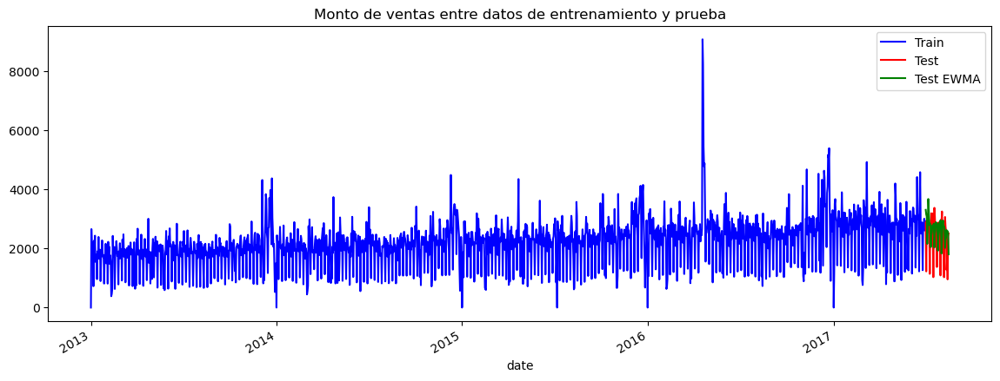

In [65]:
pd.plotting.register_matplotlib_converters()
f, ax = plt.subplots(figsize=(14,5))
X_tr.plot(kind='line', x='date', y='sales', color='blue', label='Train', ax=ax)
X_tst.plot(kind='line', x='date', y='sales', color='red', label='Test', ax=ax)
X_tst.plot(kind='line', x= 'date', y= 'sales_ewm_alpha_05_lag_16', color= 'green', label= 'Test EWMA', ax=ax)
plt.title('Monto de ventas entre datos de entrenamiento y prueba')
plt.show()

In [66]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [67]:
X_tr = X_tr.rename(columns={'date': 'ds', 'sales_ewm_alpha_05_lag_16': 'y'})
X_tst =  X_tst.rename(columns={'date': 'ds', 'sales_ewm_alpha_05_lag_16': 'y'})

In [68]:
X_tr = X_tr[['ds',
             'y']]
X_tr

,ds,y
20208,2013-01-01,NaN
20209,2013-01-02,NaN
20210,2013-01-03,NaN
20211,2013-01-04,NaN
20212,2013-01-05,NaN
...,...,...
21841,2017-06-26,3087.15
21842,2017-06-27,2219.57
21843,2017-06-28,2410.29
21844,2017-06-29,2418.14


In [69]:
X_tst = X_tst[['ds',
               'y']]
X_tst

,ds,y
21846,2017-07-01,3301.79
21847,2017-07-02,3146.39
21848,2017-07-03,3081.20
21849,2017-07-04,2152.10
21850,2017-07-05,2762.55
21851,2017-07-06,3668.77
21852,2017-07-07,3283.39
21853,2017-07-08,2891.19
21854,2017-07-09,2777.10
21855,2017-07-10,2827.05


In [70]:
X_tr_weekly = X_tr.resample("W",on='ds').sum()

In [71]:
X_tst_weekly = X_tst.resample("W",on='ds').sum()

In [72]:
X_tr_weekly.reset_index(inplace=True)
X_tst_weekly.reset_index(inplace=True)

In [73]:
X_tr_weekly=X_tr_weekly.drop([0,1,2,8])
#0,1,2,8

In [74]:
X_tst_weekly=X_tst_weekly.drop([0,7])

In [75]:
print(X_tr_weekly.sort_values('y',ascending=True))
print(X_tst_weekly.sort_values('y',ascending=True))

            ds        y
54  2014-01-19  9948.03
113 2015-03-08 10553.95
63  2014-03-23 11058.31
106 2015-01-18 11143.04
19  2013-05-19 11321.67
..         ...      ...
208 2017-01-01 23359.91
210 2017-01-15 23429.62
157 2016-01-10 24272.56
209 2017-01-08 26116.91
174 2016-05-08 34777.85

[231 rows x 2 columns]
          ds        y
6 2017-08-13 17094.12
5 2017-08-06 18001.14
4 2017-07-30 18094.52
2 2017-07-16 18103.36
3 2017-07-23 18429.76
1 2017-07-09 20616.30


In [76]:
model =Prophet()
model.fit(X_tr_weekly)

future = model.make_future_dataframe(periods=52, freq='W')
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

14:13:24 - cmdstanpy - INFO - Chain [1] start processing
14:13:24 - cmdstanpy - INFO - Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
276,2018-05-20,20527.79,18204.35,22882.26
277,2018-05-27,20010.23,17764.28,22106.72
278,2018-06-03,19851.94,17632.32,22127.53
279,2018-06-10,19888.30,17597.29,22126.26
280,2018-06-17,19897.75,17710.54,22193.17
281,2018-06-24,19863.25,17454.05,22035.97
282,2018-07-01,19870.75,17610.87,22237.43


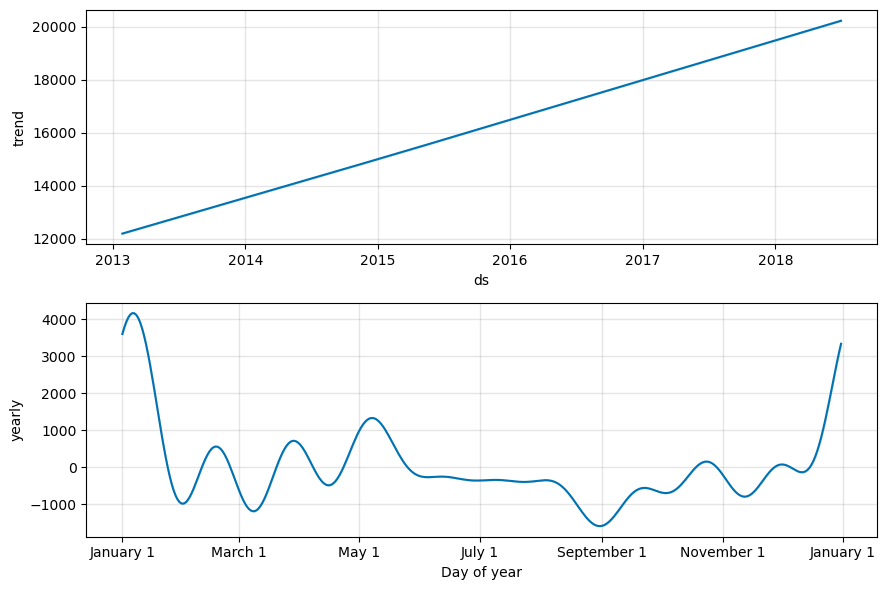

In [77]:
# Plot the components of the model
fig = model.plot_components(forecast)

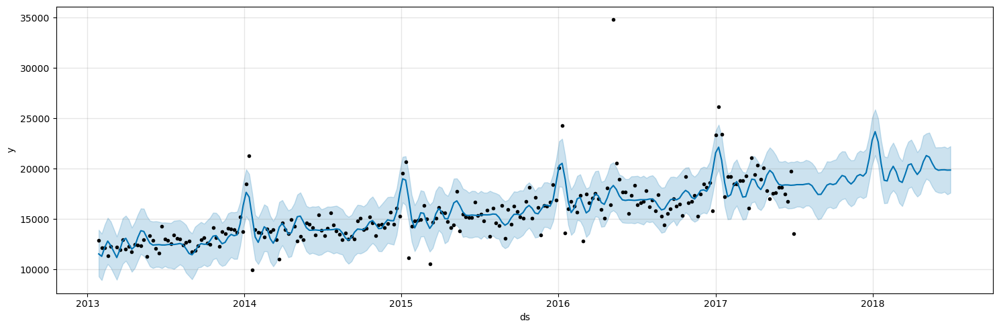

In [78]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model.plot(forecast,ax=ax)
plt.show()

In [79]:
# Comparación actuales vs predicciones

X_tst_forecast = model.predict(X_tst_weekly)
X_tst_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
0,2017-07-09,18422.84,16242.81,20736.14
1,2017-07-16,18427.07,16066.24,20757.92
2,2017-07-23,18424.99,16051.50,20697.86
3,2017-07-30,18482.38,16216.34,20615.82
4,2017-08-06,18515.76,16248.30,20709.95
5,2017-08-13,18321.12,16177.07,20747.19


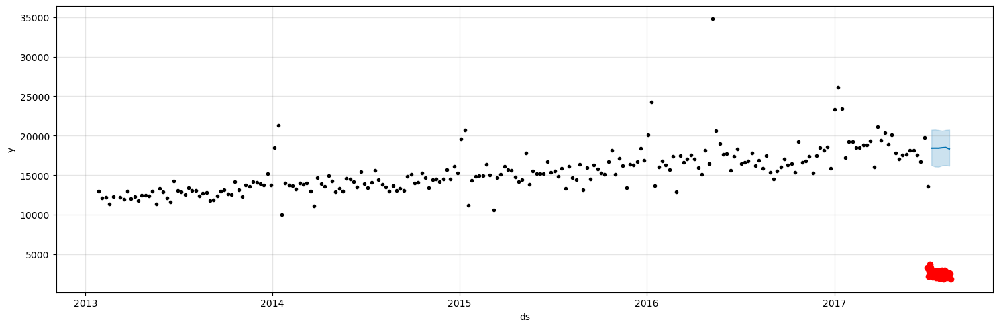

In [80]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(X_tst.ds, X_tst['y'], color='r')
fig = model.plot(X_tst_forecast, ax=ax)

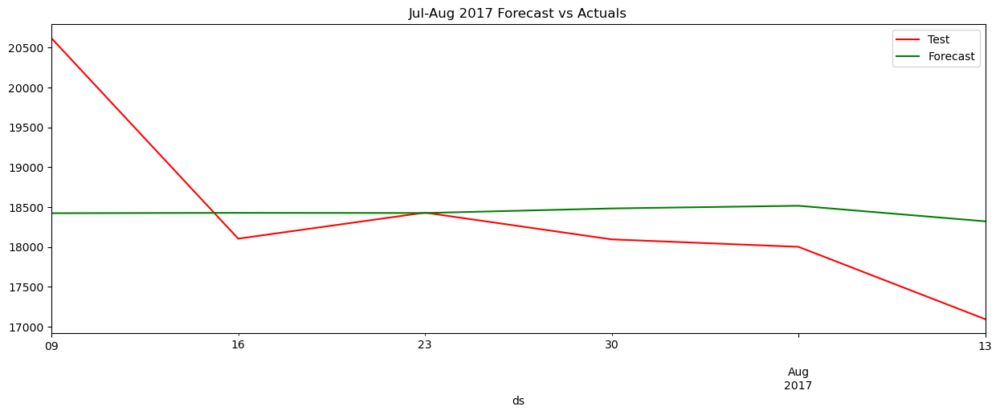

In [81]:
# Comparación ventas de test vs predicciones

f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_tst_weekly.plot(kind='line',x='ds', y='y', color='red', label='Test', ax=ax)
X_tst_forecast.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Jul-Aug 2017 Forecast vs Actuals')
plt.show()

In [82]:
# Mean Absolute Percentage Error para valores ventas de test vs predicciones

mape = mean_absolute_percentage_error(X_tst_weekly['y'],X_tst_forecast['yhat'])
print("MAPE",round(mape,4))

MAPE 4.1056


#Tuning de HyperParametros usando ParameterGrid

In [83]:
params_grid = {'seasonality_mode':('multiplicative','additive'),
               'changepoint_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'holidays_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'n_changepoints' : [100,150,200]}
grid = ParameterGrid(params_grid)
cnt = 0
for p in grid:
    cnt = cnt+1

print('Total Possible Models',cnt)

Total Possible Models 150


In [84]:
a_df =  a_df.rename(columns={'date': 'ds', 'sales': 'y'})
a_df=a_df.resample("W",on='ds').sum()
a_df.reset_index(inplace=True)
a_df=a_df[(a_df['ds']=='2017-07-02') | (a_df['ds']=='2018-07-01')]
a_df=a_df[['ds',
            'y']]

a_df

,ds,y
234,2017-07-02,18080.00


In [85]:
strt='2017-07-02'
end='2017-07-09'
#Actual = a_df[(a_df['ds']>strt) & (a_df['ds']<=end)] # DF Original

model_parameters = pd.DataFrame(columns = ['MAPE','Parameters'])
for p in grid:
    test_final_model = pd.DataFrame()
    print(p)
    random.seed(0)
    train_model =Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         n_changepoints = p['n_changepoints'],
                         seasonality_mode = p['seasonality_mode'],
                         weekly_seasonality=True,
                         daily_seasonality = True,
                         yearly_seasonality = True,
                         interval_width=0.95)
    train_model.fit(X_tr_weekly.iloc[:-2,:])
    Actual=a_df.tail(2)
    train_forecast = train_model.make_future_dataframe(periods=52, freq='W',include_history = False)
    train_forecast = train_model.predict(train_forecast)
    test_final_model=train_forecast[['ds','yhat']]
    MAPE = mean_absolute_percentage_error(Actual['y'],abs(test_final_model['yhat']))
    print('Mean Absolute Percentage Error(MAPE)------------------------------------',MAPE)
    model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)

14:13:26 - cmdstanpy - INFO - Chain [1] start processing


{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:26 - cmdstanpy - INFO - Chain [1] done processing
14:13:26 - cmdstanpy - INFO - Chain [1] start processing
14:13:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.354594095391981
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.874843383830749
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:26 - cmdstanpy - INFO - Chain [1] start processing
14:13:26 - cmdstanpy - INFO - Chain [1] done processing
14:13:26 - cmdstanpy - INFO - Chain [1] start processing
14:13:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.151879475640854
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.723379160131419
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:26 - cmdstanpy - INFO - Chain [1] start processing
14:13:26 - cmdstanpy - INFO - Chain [1] done processing
14:13:27 - cmdstanpy - INFO - Chain [1] start processing
14:13:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.068395949629169
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.704561033558303
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:27 - cmdstanpy - INFO - Chain [1] start processing
14:13:27 - cmdstanpy - INFO - Chain [1] done processing
14:13:27 - cmdstanpy - INFO - Chain [1] start processing
14:13:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.354594095391981
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.874843383830749
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:27 - cmdstanpy - INFO - Chain [1] start processing
14:13:27 - cmdstanpy - INFO - Chain [1] done processing
14:13:27 - cmdstanpy - INFO - Chain [1] start processing
14:13:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.151879475640854
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


14:13:28 - cmdstanpy - INFO - Chain [1] start processing
14:13:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.723379160131419
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:28 - cmdstanpy - INFO - Chain [1] start processing
14:13:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.068395949629169
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.704561033558303
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:28 - cmdstanpy - INFO - Chain [1] start processing
14:13:28 - cmdstanpy - INFO - Chain [1] done processing
14:13:28 - cmdstanpy - INFO - Chain [1] start processing
14:13:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.354594095391981
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.874843383830749
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:28 - cmdstanpy - INFO - Chain [1] start processing
14:13:28 - cmdstanpy - INFO - Chain [1] done processing
14:13:29 - cmdstanpy - INFO - Chain [1] start processing
14:13:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.151879475640854
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.723379160131419
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:29 - cmdstanpy - INFO - Chain [1] start processing
14:13:29 - cmdstanpy - INFO - Chain [1] done processing
14:13:29 - cmdstanpy - INFO - Chain [1] start processing
14:13:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.068395949629169
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


14:13:29 - cmdstanpy - INFO - Chain [1] start processing
14:13:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.704561033558303
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.354594095391981
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


14:13:29 - cmdstanpy - INFO - Chain [1] start processing
14:13:29 - cmdstanpy - INFO - Chain [1] done processing
14:13:30 - cmdstanpy - INFO - Chain [1] start processing
14:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.874843383830749
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.151879475640854
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


14:13:30 - cmdstanpy - INFO - Chain [1] start processing
14:13:30 - cmdstanpy - INFO - Chain [1] done processing
14:13:30 - cmdstanpy - INFO - Chain [1] start processing
14:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.723379160131419
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:30 - cmdstanpy - INFO - Chain [1] start processing
14:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.068395949629169
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.704561033558303
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:30 - cmdstanpy - INFO - Chain [1] start processing
14:13:30 - cmdstanpy - INFO - Chain [1] done processing
14:13:31 - cmdstanpy - INFO - Chain [1] start processing
14:13:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.354594095391981
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.874843383830749
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:31 - cmdstanpy - INFO - Chain [1] start processing
14:13:31 - cmdstanpy - INFO - Chain [1] done processing
14:13:31 - cmdstanpy - INFO - Chain [1] start processing
14:13:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.151879475640854
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.723379160131419
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:31 - cmdstanpy - INFO - Chain [1] start processing
14:13:31 - cmdstanpy - INFO - Chain [1] done processing
14:13:31 - cmdstanpy - INFO - Chain [1] start processing
14:13:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 8.068395949629169
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 8.704561033558303
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:32 - cmdstanpy - INFO - Chain [1] start processing
14:13:32 - cmdstanpy - INFO - Chain [1] done processing
14:13:32 - cmdstanpy - INFO - Chain [1] start processing
14:13:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.208241625213291
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.900183433614147
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:32 - cmdstanpy - INFO - Chain [1] start processing
14:13:32 - cmdstanpy - INFO - Chain [1] done processing
14:13:32 - cmdstanpy - INFO - Chain [1] start processing
14:13:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.432830569885684
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.92594516485112
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:32 - cmdstanpy - INFO - Chain [1] start processing
14:13:32 - cmdstanpy - INFO - Chain [1] done processing
14:13:32 - cmdstanpy - INFO - Chain [1] start processing
14:13:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.403188729939465
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.836316361223791
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:33 - cmdstanpy - INFO - Chain [1] start processing
14:13:33 - cmdstanpy - INFO - Chain [1] done processing
14:13:33 - cmdstanpy - INFO - Chain [1] start processing
14:13:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.208241625213291
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.900183433614147
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:33 - cmdstanpy - INFO - Chain [1] start processing
14:13:33 - cmdstanpy - INFO - Chain [1] done processing
14:13:33 - cmdstanpy - INFO - Chain [1] start processing
14:13:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.432830569885684
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.92594516485112
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:34 - cmdstanpy - INFO - Chain [1] start processing
14:13:34 - cmdstanpy - INFO - Chain [1] done processing
14:13:34 - cmdstanpy - INFO - Chain [1] start processing
14:13:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.403188729939465
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


14:13:34 - cmdstanpy - INFO - Chain [1] start processing
14:13:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.836316361223791
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.208241625213291
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


14:13:34 - cmdstanpy - INFO - Chain [1] start processing
14:13:34 - cmdstanpy - INFO - Chain [1] done processing
14:13:34 - cmdstanpy - INFO - Chain [1] start processing
14:13:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.900183433614147
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.432830569885684
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


14:13:35 - cmdstanpy - INFO - Chain [1] start processing
14:13:35 - cmdstanpy - INFO - Chain [1] done processing
14:13:35 - cmdstanpy - INFO - Chain [1] start processing
14:13:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.92594516485112
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.403188729939465
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


14:13:35 - cmdstanpy - INFO - Chain [1] start processing
14:13:35 - cmdstanpy - INFO - Chain [1] done processing
14:13:35 - cmdstanpy - INFO - Chain [1] start processing
14:13:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.836316361223791
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.208241625213291
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


14:13:35 - cmdstanpy - INFO - Chain [1] start processing
14:13:35 - cmdstanpy - INFO - Chain [1] done processing
14:13:36 - cmdstanpy - INFO - Chain [1] start processing
14:13:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.900183433614147
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.432830569885684
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


14:13:36 - cmdstanpy - INFO - Chain [1] start processing
14:13:36 - cmdstanpy - INFO - Chain [1] done processing
14:13:36 - cmdstanpy - INFO - Chain [1] start processing
14:13:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.92594516485112
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.403188729939465
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


14:13:36 - cmdstanpy - INFO - Chain [1] start processing
14:13:36 - cmdstanpy - INFO - Chain [1] done processing
14:13:36 - cmdstanpy - INFO - Chain [1] start processing
14:13:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.836316361223791
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.208241625213291
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


14:13:37 - cmdstanpy - INFO - Chain [1] start processing
14:13:37 - cmdstanpy - INFO - Chain [1] done processing
14:13:37 - cmdstanpy - INFO - Chain [1] start processing
14:13:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.900183433614147
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.432830569885684
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive'}


14:13:37 - cmdstanpy - INFO - Chain [1] start processing
14:13:37 - cmdstanpy - INFO - Chain [1] done processing
14:13:37 - cmdstanpy - INFO - Chain [1] start processing
14:13:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.92594516485112
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:37 - cmdstanpy - INFO - Chain [1] start processing
14:13:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.403188729939465
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive'}


14:13:38 - cmdstanpy - INFO - Chain [1] start processing
14:13:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.836316361223791
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:38 - cmdstanpy - INFO - Chain [1] start processing
14:13:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.74829910505047
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.32494939070878
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:38 - cmdstanpy - INFO - Chain [1] start processing
14:13:38 - cmdstanpy - INFO - Chain [1] done processing
14:13:38 - cmdstanpy - INFO - Chain [1] start processing
14:13:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.666404088968954
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.135306502970963
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:38 - cmdstanpy - INFO - Chain [1] start processing
14:13:38 - cmdstanpy - INFO - Chain [1] done processing
14:13:39 - cmdstanpy - INFO - Chain [1] start processing
14:13:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.670406977997709
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.125748029711224
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:39 - cmdstanpy - INFO - Chain [1] start processing
14:13:39 - cmdstanpy - INFO - Chain [1] done processing
14:13:39 - cmdstanpy - INFO - Chain [1] start processing
14:13:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.74829910505047
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.32494939070878
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:39 - cmdstanpy - INFO - Chain [1] start processing
14:13:39 - cmdstanpy - INFO - Chain [1] done processing
14:13:39 - cmdstanpy - INFO - Chain [1] start processing
14:13:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.666404088968954
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.135306502970963
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:39 - cmdstanpy - INFO - Chain [1] start processing
14:13:39 - cmdstanpy - INFO - Chain [1] done processing
14:13:40 - cmdstanpy - INFO - Chain [1] start processing
14:13:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.670406977997709
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.125748029711224
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:40 - cmdstanpy - INFO - Chain [1] start processing
14:13:40 - cmdstanpy - INFO - Chain [1] done processing
14:13:40 - cmdstanpy - INFO - Chain [1] start processing
14:13:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.74829910505047
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.32494939070878
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:40 - cmdstanpy - INFO - Chain [1] start processing
14:13:40 - cmdstanpy - INFO - Chain [1] done processing
14:13:40 - cmdstanpy - INFO - Chain [1] start processing
14:13:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.666404088968954
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.135306502970963
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:40 - cmdstanpy - INFO - Chain [1] start processing
14:13:40 - cmdstanpy - INFO - Chain [1] done processing
14:13:41 - cmdstanpy - INFO - Chain [1] start processing
14:13:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.670406977997709
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.125748029711224
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:41 - cmdstanpy - INFO - Chain [1] start processing
14:13:41 - cmdstanpy - INFO - Chain [1] done processing
14:13:41 - cmdstanpy - INFO - Chain [1] start processing
14:13:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.74829910505047
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.32494939070878
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:41 - cmdstanpy - INFO - Chain [1] start processing
14:13:41 - cmdstanpy - INFO - Chain [1] done processing
14:13:41 - cmdstanpy - INFO - Chain [1] start processing
14:13:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.666404088968954
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.135306502970963
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:41 - cmdstanpy - INFO - Chain [1] start processing
14:13:42 - cmdstanpy - INFO - Chain [1] done processing
14:13:42 - cmdstanpy - INFO - Chain [1] start processing
14:13:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.670406977997709
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.125748029711224
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:42 - cmdstanpy - INFO - Chain [1] start processing
14:13:42 - cmdstanpy - INFO - Chain [1] done processing
14:13:42 - cmdstanpy - INFO - Chain [1] start processing
14:13:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.74829910505047
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.32494939070878
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:42 - cmdstanpy - INFO - Chain [1] start processing
14:13:42 - cmdstanpy - INFO - Chain [1] done processing
14:13:42 - cmdstanpy - INFO - Chain [1] start processing
14:13:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.666404088968954
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.135306502970963
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:43 - cmdstanpy - INFO - Chain [1] start processing
14:13:43 - cmdstanpy - INFO - Chain [1] done processing
14:13:43 - cmdstanpy - INFO - Chain [1] start processing
14:13:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.670406977997709
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 6.125748029711224
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:43 - cmdstanpy - INFO - Chain [1] start processing
14:13:43 - cmdstanpy - INFO - Chain [1] done processing
14:13:44 - cmdstanpy - INFO - Chain [1] start processing
14:13:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.87182930121536
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.724815540060681
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:44 - cmdstanpy - INFO - Chain [1] start processing
14:13:44 - cmdstanpy - INFO - Chain [1] done processing
14:13:44 - cmdstanpy - INFO - Chain [1] start processing
14:13:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.170047817058589
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.667050541834728
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:44 - cmdstanpy - INFO - Chain [1] start processing
14:13:45 - cmdstanpy - INFO - Chain [1] done processing
14:13:45 - cmdstanpy - INFO - Chain [1] start processing
14:13:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.850037584466301
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.6728570242168255
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:45 - cmdstanpy - INFO - Chain [1] start processing
14:13:46 - cmdstanpy - INFO - Chain [1] done processing
14:13:46 - cmdstanpy - INFO - Chain [1] start processing
14:13:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.87182930121536
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.724815540060681
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:46 - cmdstanpy - INFO - Chain [1] start processing
14:13:46 - cmdstanpy - INFO - Chain [1] done processing
14:13:46 - cmdstanpy - INFO - Chain [1] start processing
14:13:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.170047817058589
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.667050541834728
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:46 - cmdstanpy - INFO - Chain [1] start processing
14:13:47 - cmdstanpy - INFO - Chain [1] done processing
14:13:47 - cmdstanpy - INFO - Chain [1] start processing
14:13:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.850037584466301
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.6728570242168255
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:47 - cmdstanpy - INFO - Chain [1] start processing
14:13:48 - cmdstanpy - INFO - Chain [1] done processing
14:13:48 - cmdstanpy - INFO - Chain [1] start processing
14:13:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.87182930121536
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.724815540060681
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:48 - cmdstanpy - INFO - Chain [1] start processing
14:13:48 - cmdstanpy - INFO - Chain [1] done processing
14:13:48 - cmdstanpy - INFO - Chain [1] start processing
14:13:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.170047817058589
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.667050541834728
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:48 - cmdstanpy - INFO - Chain [1] start processing
14:13:49 - cmdstanpy - INFO - Chain [1] done processing
14:13:49 - cmdstanpy - INFO - Chain [1] start processing
14:13:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.850037584466301
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.6728570242168255
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:49 - cmdstanpy - INFO - Chain [1] start processing
14:13:50 - cmdstanpy - INFO - Chain [1] done processing
14:13:50 - cmdstanpy - INFO - Chain [1] start processing
14:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.87182930121536
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.724815540060681
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:50 - cmdstanpy - INFO - Chain [1] start processing
14:13:50 - cmdstanpy - INFO - Chain [1] done processing
14:13:50 - cmdstanpy - INFO - Chain [1] start processing
14:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.170047817058589
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.667050541834728
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:51 - cmdstanpy - INFO - Chain [1] start processing
14:13:51 - cmdstanpy - INFO - Chain [1] done processing
14:13:51 - cmdstanpy - INFO - Chain [1] start processing
14:13:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.850037584466301
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.6728570242168255
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:52 - cmdstanpy - INFO - Chain [1] start processing
14:13:52 - cmdstanpy - INFO - Chain [1] done processing
14:13:52 - cmdstanpy - INFO - Chain [1] start processing
14:13:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.87182930121536
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.724815540060681
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:52 - cmdstanpy - INFO - Chain [1] start processing
14:13:53 - cmdstanpy - INFO - Chain [1] done processing
14:13:53 - cmdstanpy - INFO - Chain [1] start processing
14:13:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.170047817058589
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.667050541834728
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:53 - cmdstanpy - INFO - Chain [1] start processing
14:13:54 - cmdstanpy - INFO - Chain [1] done processing
14:13:54 - cmdstanpy - INFO - Chain [1] start processing
14:13:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.850037584466301
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.6728570242168255
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:54 - cmdstanpy - INFO - Chain [1] start processing
14:13:54 - cmdstanpy - INFO - Chain [1] done processing
14:13:55 - cmdstanpy - INFO - Chain [1] start processing
14:13:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.9693051901121255
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.497873002294206
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:55 - cmdstanpy - INFO - Chain [1] start processing
14:13:55 - cmdstanpy - INFO - Chain [1] done processing
14:13:55 - cmdstanpy - INFO - Chain [1] start processing
14:13:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.903561609144364
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.374971294157493
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:56 - cmdstanpy - INFO - Chain [1] start processing
14:13:56 - cmdstanpy - INFO - Chain [1] done processing
14:13:57 - cmdstanpy - INFO - Chain [1] start processing
14:13:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.86463801440097
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.4235158748316445
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:57 - cmdstanpy - INFO - Chain [1] start processing
14:13:57 - cmdstanpy - INFO - Chain [1] done processing
14:13:57 - cmdstanpy - INFO - Chain [1] start processing
14:13:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.9693051901121255
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.497873002294206
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:13:58 - cmdstanpy - INFO - Chain [1] start processing
14:13:58 - cmdstanpy - INFO - Chain [1] done processing
14:13:58 - cmdstanpy - INFO - Chain [1] start processing
14:13:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.903561609144364
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.374971294157493
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:13:58 - cmdstanpy - INFO - Chain [1] start processing
14:13:59 - cmdstanpy - INFO - Chain [1] done processing
14:13:59 - cmdstanpy - INFO - Chain [1] start processing
14:13:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.86463801440097
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.4235158748316445
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:13:59 - cmdstanpy - INFO - Chain [1] start processing
14:14:00 - cmdstanpy - INFO - Chain [1] done processing
14:14:00 - cmdstanpy - INFO - Chain [1] start processing
14:14:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.9693051901121255
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive'}


14:14:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 5.497873002294206
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:14:01 - cmdstanpy - INFO - Chain [1] done processing
14:14:01 - cmdstanpy - INFO - Chain [1] start processing
14:14:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.903561609144364
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.374971294157493
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:14:01 - cmdstanpy - INFO - Chain [1] start processing
14:14:02 - cmdstanpy - INFO - Chain [1] done processing
14:14:02 - cmdstanpy - INFO - Chain [1] start processing
14:14:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.86463801440097
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.4235158748316445
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:14:02 - cmdstanpy - INFO - Chain [1] start processing
14:14:03 - cmdstanpy - INFO - Chain [1] done processing
14:14:03 - cmdstanpy - INFO - Chain [1] start processing
14:14:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.9693051901121255
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.497873002294206
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:14:03 - cmdstanpy - INFO - Chain [1] start processing
14:14:04 - cmdstanpy - INFO - Chain [1] done processing
14:14:04 - cmdstanpy - INFO - Chain [1] start processing
14:14:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.903561609144364
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.374971294157493
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:14:04 - cmdstanpy - INFO - Chain [1] start processing
14:14:05 - cmdstanpy - INFO - Chain [1] done processing
14:14:05 - cmdstanpy - INFO - Chain [1] start processing
14:14:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.86463801440097
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.4235158748316445
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative'}


14:14:05 - cmdstanpy - INFO - Chain [1] start processing
14:14:05 - cmdstanpy - INFO - Chain [1] done processing
14:14:06 - cmdstanpy - INFO - Chain [1] start processing
14:14:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.9693051901121255
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.497873002294206
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative'}


14:14:06 - cmdstanpy - INFO - Chain [1] start processing
14:14:06 - cmdstanpy - INFO - Chain [1] done processing
14:14:06 - cmdstanpy - INFO - Chain [1] start processing
14:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.903561609144364
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.374971294157493
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative'}


14:14:07 - cmdstanpy - INFO - Chain [1] start processing
14:14:07 - cmdstanpy - INFO - Chain [1] done processing
14:14:08 - cmdstanpy - INFO - Chain [1] start processing
14:14:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 6.86463801440097
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 5.4235158748316445


In [86]:
parameters = model_parameters.sort_values(by=['MAPE'])
parameters = parameters.reset_index(drop=True)
parameters.head()

,MAPE,Parameters
0,5.17,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
1,5.17,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
2,5.17,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
3,5.17,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
4,5.17,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."


In [87]:
parameters['Parameters'][0]

{'changepoint_prior_scale': 0.4,
 'holidays_prior_scale': 0.1,
 'n_changepoints': 150,
 'seasonality_mode': 'multiplicative'}

In [88]:
# Setup and train final model
final_model = Prophet(changepoint_prior_scale= 0.4,
                      holidays_prior_scale = 0.1,
                      n_changepoints = 150,
                      seasonality_mode = 'multiplicative',
                      weekly_seasonality=True,
                      daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95)
final_model.fit(X_tr_weekly)



14:14:08 - cmdstanpy - INFO - Chain [1] start processing


14:14:09 - cmdstanpy - INFO - Chain [1] done processing


In [89]:
future = final_model.make_future_dataframe(periods=52, freq='W')
forecast = final_model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
276,2018-05-20,17830.03,-319.08,36032.21
277,2018-05-27,17114.47,-586.44,34280.13
278,2018-06-03,16949.38,-2020.19,34930.10
279,2018-06-10,17112.58,-1568.43,35502.26
280,2018-06-17,17200.08,-3430.45,37276.49
281,2018-06-24,17070.23,-2933.01,36196.07
282,2018-07-01,16839.21,-2760.51,36957.28


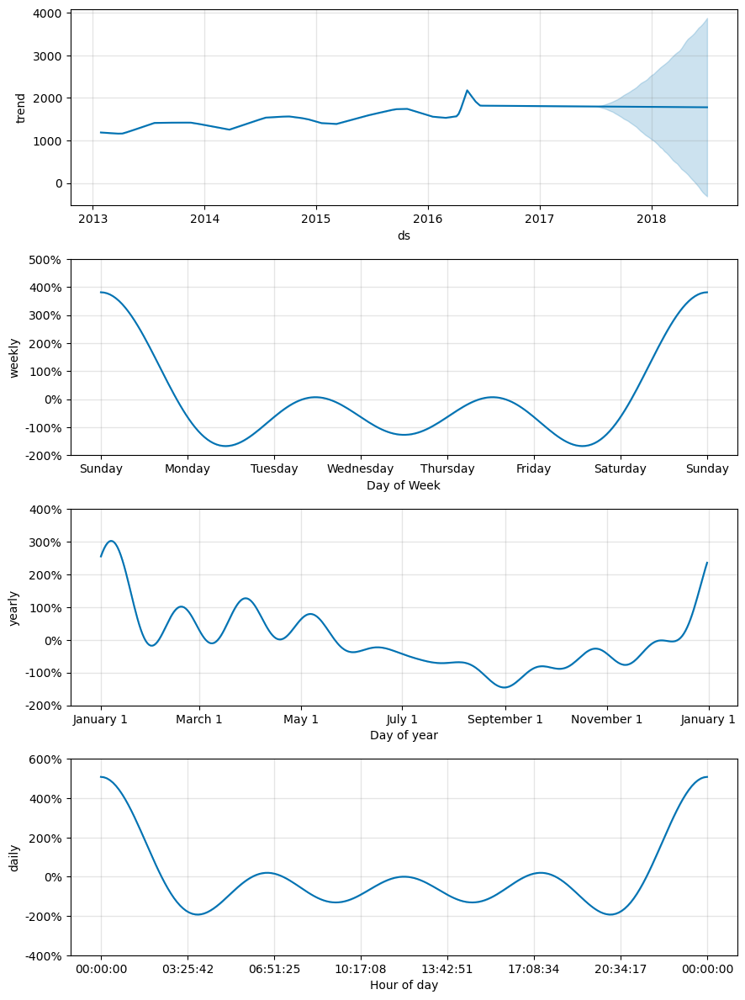

In [90]:
# Plot the components of the model
fig = final_model.plot_components(forecast)

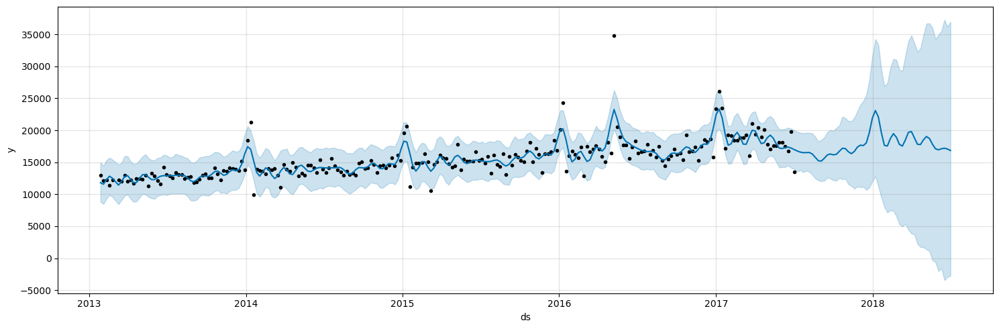

In [91]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_model.plot(forecast,ax=ax)
plt.show()

In [92]:
X_tst_final= final_model.predict(X_tst_weekly)
X_tst_final[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
0,2017-07-09,16763.90,13490.52,19731.89
1,2017-07-16,16592.37,13544.78,19603.57
2,2017-07-23,16498.49,13454.47,19466.80
3,2017-07-30,16517.34,13630.59,19669.74
4,2017-08-06,16530.44,13512.63,19763.46
5,2017-08-13,16298.26,13346.50,19545.26


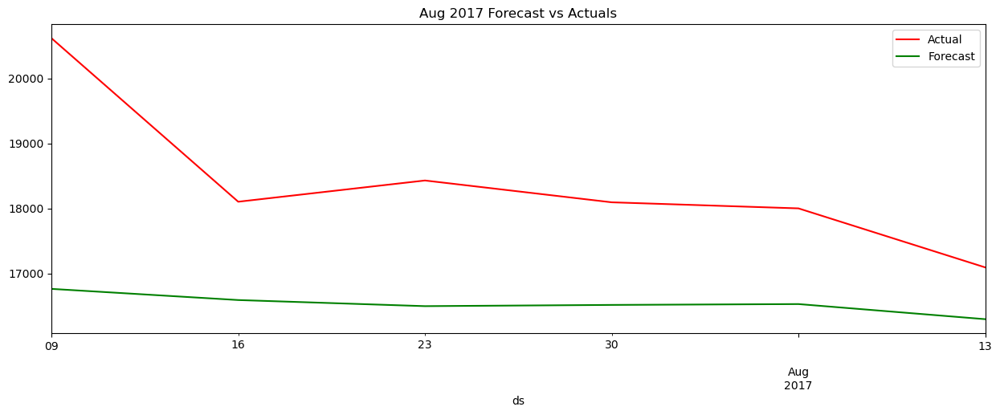

In [93]:
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_tst_weekly.plot(kind='line',x='ds', y='y', color='red', label='Actual', ax=ax)
X_tst_final.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Aug 2017 Forecast vs Actuals')
plt.show()

In [94]:
MAPE = mean_absolute_percentage_error(X_tst_weekly['y'],abs(X_tst_final['yhat']))
print('MAPE', MAPE)

MAPE 9.842307025239842


In [181]:
def root_mean_squared_error(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    return np.sqrt(mse)


In [183]:
rmse = root_mean_squared_error(X_tst_weekly['y'], X_tst_final['yhat'])
print('RMSE', rmse)

RMSE 2087.170642596238


In [95]:
forecast = forecast[['ds',
                     'yhat',
                     'yhat_lower',
                     'yhat_upper']]

In [96]:
forecast

,ds,yhat,yhat_lower,yhat_upper
0,2013-01-27,11810.92,8825.91,15013.98
1,2013-02-03,11572.90,8489.29,14448.63
2,2013-02-10,12277.42,9302.59,15334.62
3,2013-02-17,12820.69,9889.80,15706.47
4,2013-02-24,12501.43,9562.60,15420.07
...,...,...,...,...
278,2018-06-03,16949.38,-2020.19,34930.10
279,2018-06-10,17112.58,-1568.43,35502.26
280,2018-06-17,17200.08,-3430.45,37276.49
281,2018-06-24,17070.23,-2933.01,36196.07


In [97]:
modelo_entrenado = forecast

# Guardar el modelo en un archivo .pkl
with open('modelo_entrenado.pkl', 'wb') as archivo:
    pickle.dump(modelo_entrenado, archivo)


In [98]:
# Cargar el modelo desde el archivo .pkl
#with open('modelo_entrenado.pkl', 'rb') as archivo:
    #modelo_cargado = pickle.load(archivo)